<a href="https://colab.research.google.com/github/pradlanka/Apziva/blob/main/Q9MwvUueFZ02RjAH/ValueInvestor.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

ValueInvestor




Background:


We are a portfolio investment company and we make investments in the emerging markets around the world. Our company profits by investing in profitable companies, buying, holding and selling company stocks based on value investing principles.


Our goal is to establish a robust intelligent system to aid our value investing efforts using stock market data. We make investment decisions and based on intrinsic value of companies and do not trade on the basis of daily market volatility. Our profit realization strategy typically involves weekly, monthly and quarterly performance of stocks we buy or hold.


Data Description:


You are given a set of portfolio companies trading data from emerging markets including 2020 Q1-Q2-Q3-Q4 2021 Q1 stock prices. Each company stock is provided in different sheets. Each market's operating days varies based on the country of the company and the market the stocks are exchanged. Use only 2020 data and predict with 2021 Q1 data.


Download Data:


https://docs.google.com/spreadsheets/d/1MiunF_O8eNWIcfaOA4PVm668RN7FgLNA0a6U4LWf5Bk/edit?usp=sharing


Goal(s):


Predict stock price valuations on a daily, weekly and monthly basis. Recommend BUY, HOLD, SELL decisions. Maximize capital returns, minimize losses. Ideally a loss should never happen. Minimize HOLD period.


Success Metrics:


Evaluate on the basis of capital returns. Use Bollinger Bands to measure your systems effectiveness.



In [ ]:
# import libraries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
# Install darts which will  be used for forecasting
!pip install --quiet darts

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 72.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.3/135.3 kB 22.1 MB/s eta 0:00:00


In [ ]:
# Mount google drive, so that we can use the data

from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
# Read the xlsx file containing the data
# Load all sheets into a dictionary of dataframes
xls = pd.ExcelFile("/content/gdrive/My Drive/2020Q1Q2Q3Q4-2021Q1.xlsx")
sheet_dict = {sheet_name: xls.parse(sheet_name) for sheet_name in xls.sheet_names}
# Function to preprocess each dataframe
def preprocess_df(df):
    # Drop the last row
    df.drop(df.tail(1).index, inplace=True)

    # Convert columns to numeric
    for col in ['Price', 'Open', 'High', 'Low', 'Change %']:
        df[col] = pd.to_numeric(df[col], errors='coerce')

    # Convert 'Vol.' column to numeric, handling units
    df['Vol.'] = df['Vol.'].str.replace('K', 'e3').str.replace('M', 'e6').str.replace('B', 'e9').str.replace('-', '0')
    df['Vol.'] = pd.to_numeric(df['Vol.'], errors='coerce')

    # Convert 'Date' column to datetime
    df['Date'] = pd.to_datetime(df['Date'], format='%d-%b-%y')
    df.set_index('Date', inplace=True)

    # Reindex to business days
    df = df.asfreq('B')

    # Sort by date
    df.sort_index(ascending=True, inplace=True)

    # Forward fill missing values
    df.ffill(inplace=True)

    return df


# Apply preprocessing to each dataframe
sheet_dict = {sheet_name: preprocess_df(df) for sheet_name, df in sheet_dict.items()}

# Display the names of the sheets and the first few rows of each sheet
for sheet_name, df in sheet_dict.items():
    print(sheet_name)
    print(df.head(2))
    print('\n')


Russia - Sberbank Rossii PAO (S
            Price    Open    High    Low        Vol.  Change %
Date                                                          
2020-01-03  255.0  255.99  258.19  253.7  35850000.0    0.0010
2020-01-06  253.9  254.75  254.84  251.4  22350000.0   -0.0043


Turkey - Koc Holding AS (KCHOL)
            Price   Open   High    Low       Vol.  Change %
Date                                                       
2020-01-02  20.38  20.42  20.44  20.24  2530000.0    0.0030
2020-01-03  20.30  20.30  20.44  19.97  3310000.0   -0.0039


Egypt - Medinet Nasr Housing (M
            Price  Open  High   Low      Vol.  Change %
Date                                                   
2020-01-02   4.81  4.81  4.87  4.78  241600.0   -0.0021
2020-01-03   4.81  4.81  4.87  4.78  241600.0   -0.0021


Brazil - Minerva SABrazil (BEEF
            Price   Open   High    Low       Vol.  Change %
Date                                                       
2020-01-02  12.57  12.88  12.9

In [ ]:
# Function to plot the mutliple columns of the stock data
import math
def plot_series(time, series, format="-", start=0, end=None):
    """
    Visualizes time series data

    Args:
      time (array of int) - contains the time steps
      series (array of int or DataFrame) - contains the measurements for each time step
      format - line style when plotting the graph
      start - first time step to plot
      end - last time step to plot
    """

    # Check if series is a DataFrame
    if isinstance(series, pd.DataFrame):
        num_columns = series.shape[1]
        fig, axes = plt.subplots(math.ceil(num_columns/3),3, figsize=(4 * num_columns, 5), sharex=True)

        if num_columns == 1:
            axes = [axes]

        for i, column in enumerate(series.columns):
            axes[i//3, i%3].plot(time[start:end], series[column][start:end], format)
            axes[i//3, i%3].set_ylabel(column)
            axes[i//3, i%3].grid(True)
            axes[i//3, i%3].set_xlabel("Time")

    else:
        # Plot a single series
        plt.figure(figsize=(10, 2))
        plt.plot(time[start:end], series[start:end], format)
        plt.xlabel("Time")
        plt.ylabel("Value")
        plt.grid(True)

    # Draw the graph on screen
    plt.show()

Company:  Russia - Sberbank Rossii PAO (S


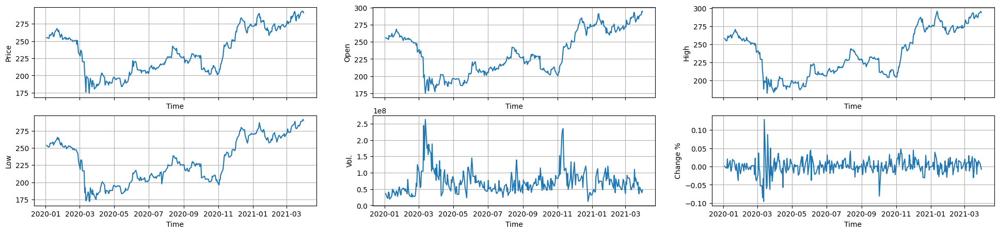

Company:  Turkey - Koc Holding AS (KCHOL)


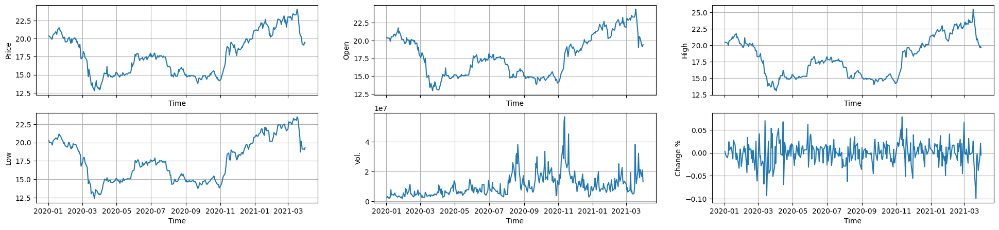

Company:  Egypt - Medinet Nasr Housing (M


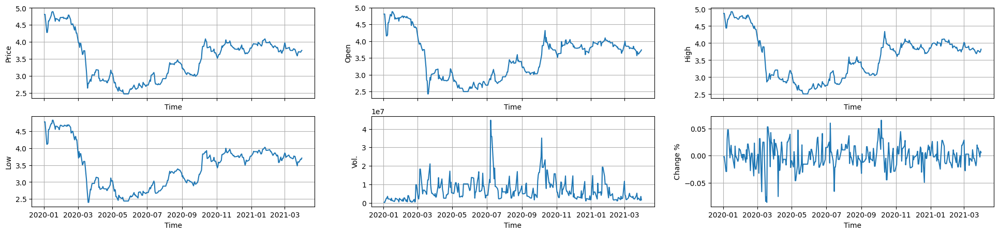

Company:  Brazil - Minerva SABrazil (BEEF


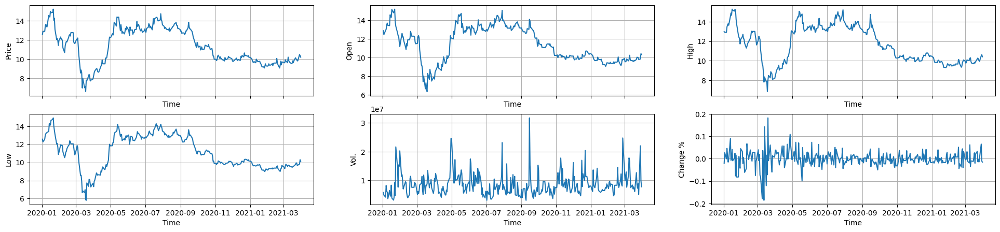

Company:  Argentina - Pampa Energia SA (P


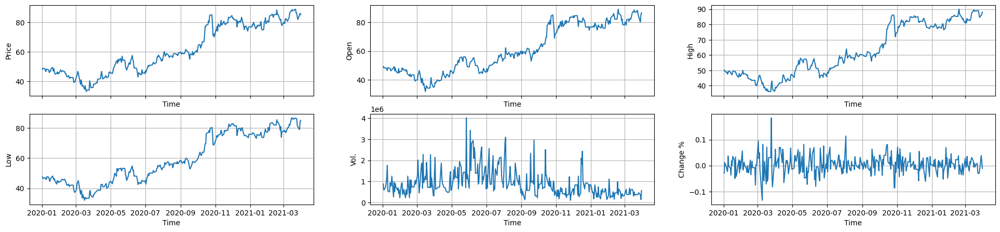

Company:  Colombia - Cementos Argos SA (C


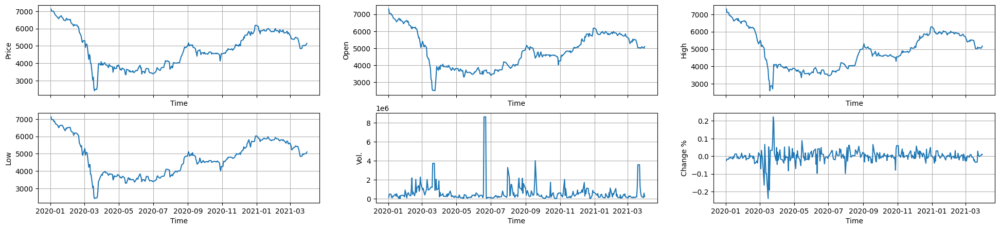

Company:  South Africa - Impala Platinum 


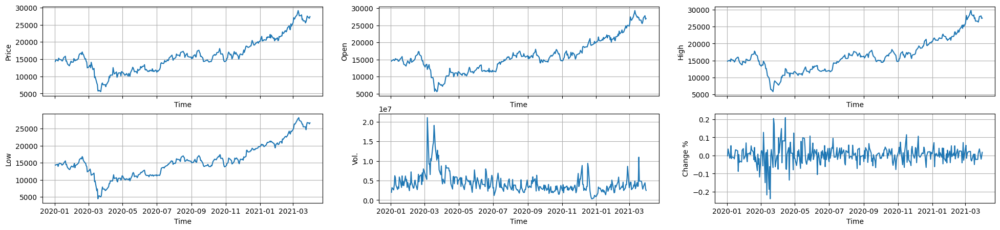

Company:  South Korea - Dongkuk Steel Mil


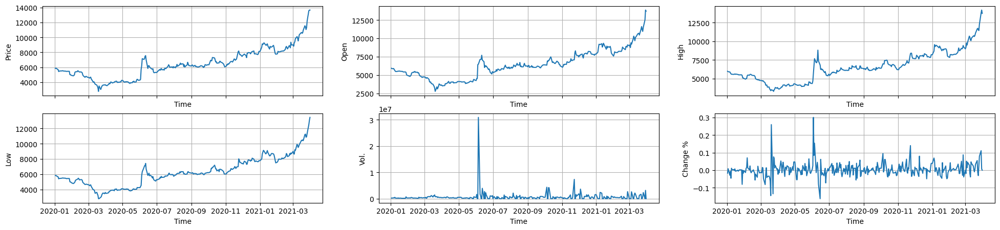

In [ ]:
# Visualziing the data for each of the 8 companies
for sheet_name, df in sheet_dict.items():
  print("Company: ", sheet_name)
  plot_series(df.index, df,  format="-", start=0, end=None)


Let us also explore the relationship in stock price between the different companies

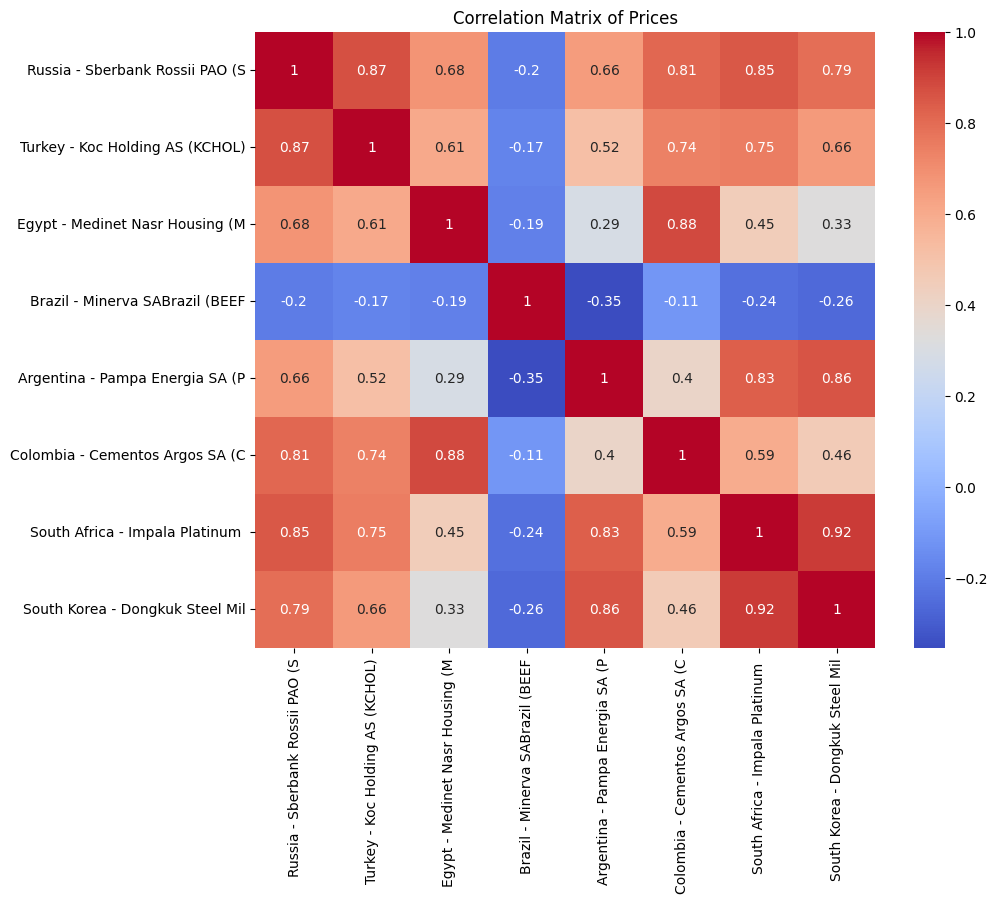

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_price_correlations(sheet_dict):
    """
    Extract the 'Price' column from each DataFrame in the dictionary and plot the correlation heatmap.

    :param sheet_dict: Dictionary with sheet names as keys and DataFrames as values.
    """
    # Create an empty DataFrame to hold the 'Price' columns
    prices_df = pd.DataFrame()

    # Extract the 'Price' column from each DataFrame
    for company, df in sheet_dict.items():
        if 'Price' in df.columns:
            prices_df[company] = df['Price']

    # Compute the correlation matrix
    correlation_matrix = prices_df.corr()

    # Plot the heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0, linecolor='white')
    plt.title('Correlation Matrix of Prices')
    plt.show()

plot_price_correlations(sheet_dict)

Also lets look at the lagged relationships between the current price and the previous values of the other columns to see if the lagged values of them can help predict future values of the stock price.

Processing company: Russia - Sberbank Rossii PAO (S


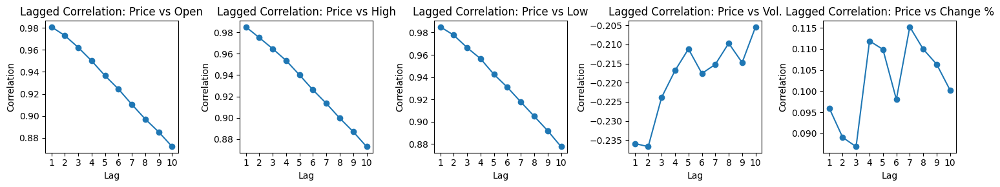

Processing company: Turkey - Koc Holding AS (KCHOL)


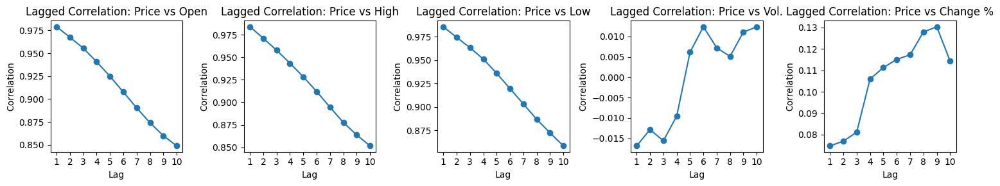

Processing company: Egypt - Medinet Nasr Housing (M


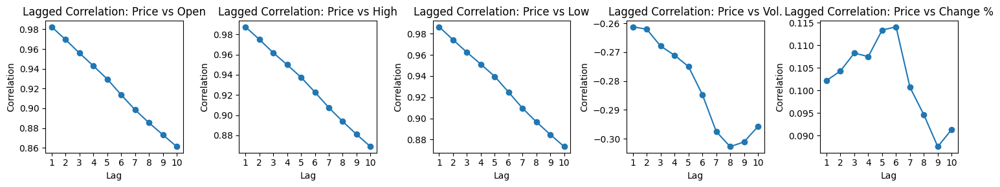

Processing company: Brazil - Minerva SABrazil (BEEF


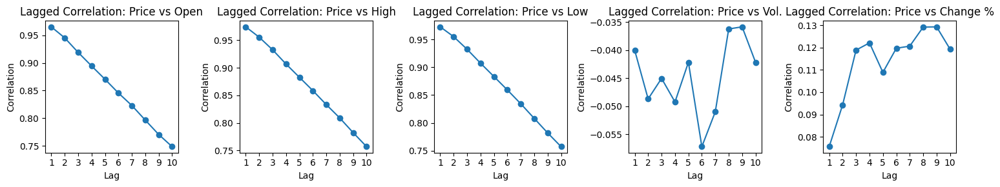

Processing company: Argentina - Pampa Energia SA (P


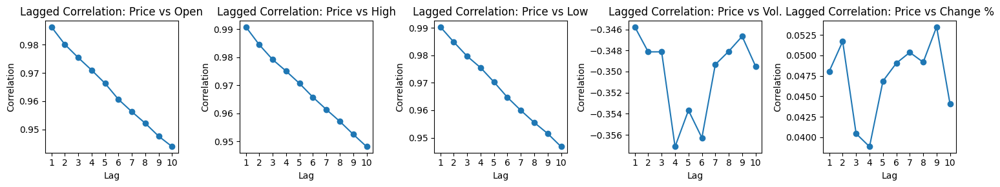

Processing company: Colombia - Cementos Argos SA (C


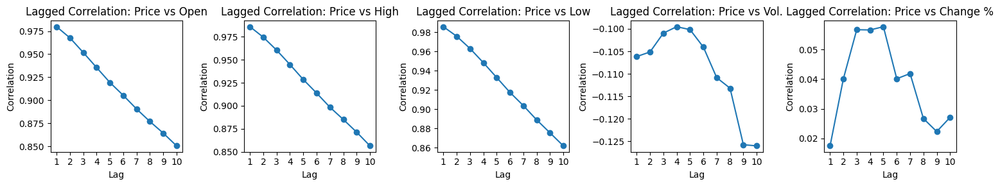

Processing company: South Africa - Impala Platinum 


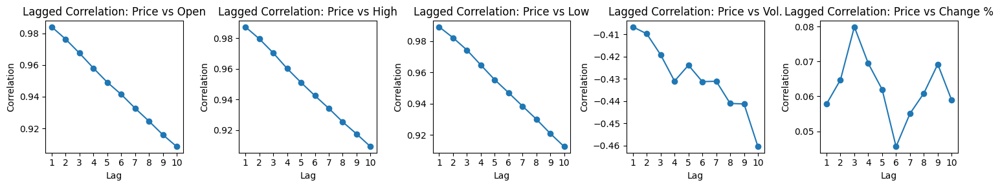

Processing company: South Korea - Dongkuk Steel Mil


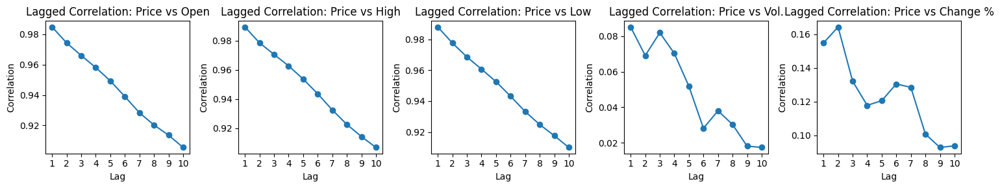

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_lagged_correlations(sheet_dict, lags=10):
    """
    Plot the correlation between 'Price' and lagged values of other columns for each company.

    :param sheet_dict: Dictionary with sheet names as keys and DataFrames as values.
    :param lags: Number of lags to include in the plot.
    """


    for company, df in sheet_dict.items():
        print(f"Processing company: {company}")

        # List of columns to compare with 'Price'
        other_columns = [col for col in df.columns if col != 'Price']

        # Create subplots
        n_cols = 5
        n_rows = 1
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 3* n_rows), squeeze=False)

        # Plot the lagged correlations
        for idx, col in enumerate(other_columns):
            row, col_idx = divmod(idx, n_cols)
            ax = axes[row][col_idx]

            correlations = []
            for lag in range(1, lags + 1):
                df_lagged = df.copy()
                df_lagged[f'Lagged_{col}'] = df_lagged[col].shift(lag)
                correlation = df_lagged['Price'].corr(df_lagged[f'Lagged_{col}'])
                correlations.append(correlation)

            ax.plot(range(1, lags + 1), correlations, marker='o')
            ax.set_title(f'Lagged Correlation: Price vs {col}')
            ax.set_xlabel('Lag')
            ax.set_ylabel('Correlation')
            ax.set_xticks(range(1, lags + 1))

        # Remove any unused subplots
        for idx in range(len(other_columns), n_rows * n_cols):
            fig.delaxes(axes.flatten()[idx])

        plt.tight_layout()
        plt.show()


plot_lagged_correlations(sheet_dict)

The previous days volume, and the previous days prices may have some helpful information to predict the future prices of the stock, beyond just the previous value of the stock.

## **1. ARIMA model.**
This is the simplest model we can use. We will use the past values of the 'price' timeseries, seasonality, and trends to make predictions. We will not be using any other variables for prediction.

## **1.1 Finding the model orders of the ARIMA model from the acf, pacf plots along with the fourier analysis**

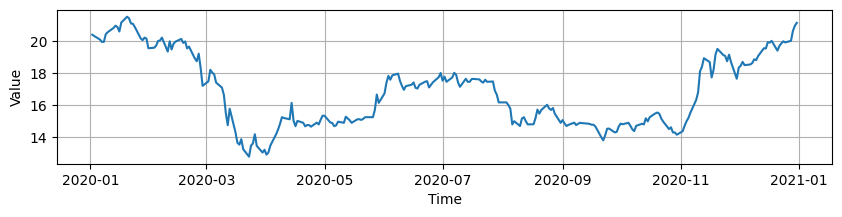

ADF Statistic: -1.508279
p-value: 0.529412
KPSS Statistic: 0.335378
p-value: 0.100000


<ipython-input-7-31096063a4b2>:26: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_test = kpss(train_data["Price"])


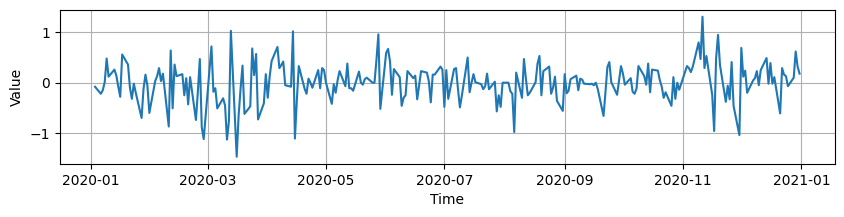

ADF Statistic: -6.353448
p-value: 0.000000
KPSS Statistic: 0.483957
p-value: 0.045280


In [ ]:
# Lets explore he data for Turkey - Koc Holding AS (KCHOL)
data = sheet_dict['Turkey - Koc Holding AS (KCHOL)']

# Split the data into training and testing sets
train_data = data[data.index < '2021-01-01']
test_data = data[data.index >= '2021-01-01']

# Ensure the data is sorted by date in ascending order for training
train_data.sort_index(ascending=True, inplace=True)
test_data.sort_index(ascending=True, inplace=True)

# Checking the time series for stationarity

# Import the adfuller and the kpss
# function
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import kpss
plot_series(train_data.index, train_data["Price"],  format="-", start=0, end=None)

# Check for stationarity using the Augmented Dickey-Fuller test
adf_test = adfuller(train_data["Price"])
print('ADF Statistic: %f' % adf_test[0])
print('p-value: %f' % adf_test[1])

# We can also do the KPSS test for stationarity
kpss_test = kpss(train_data["Price"])
print('KPSS Statistic: %f' % kpss_test[0])
print('p-value: %f' % kpss_test[1])


# Differencing the data to make it stationary

# Differencing the data
data_diff_price= train_data["Price"].diff().dropna()

# Plot the differenced data
plot_series(data_diff_price.index, data_diff_price,  format="-", start=0, end=None)

# Check for stationarity
adf_test_diff = adfuller(data_diff_price)
print('ADF Statistic: %f' % adf_test_diff[0])
print('p-value: %f' % adf_test_diff[1])

kpss_test_diff = kpss(data_diff_price)
print('KPSS Statistic: %f' % kpss_test_diff[0])
print('p-value: %f' % kpss_test_diff[1])


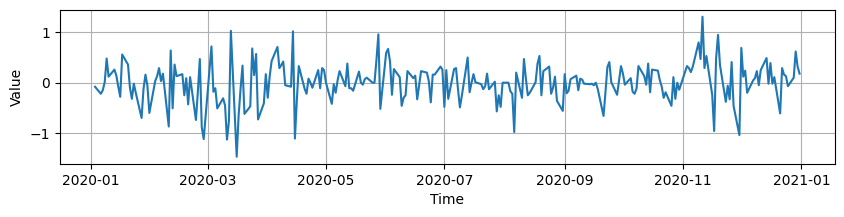

ADF Statistic: -6.353448
p-value: 0.000000
KPSS Statistic: 0.483957
p-value: 0.045280


In [ ]:

# Differencing the data to make it stationary

# Differencing the data
data_diff_price= train_data["Price"].diff().dropna()

# Plot the differenced data
plot_series(data_diff_price.index, data_diff_price,  format="-", start=0, end=None)

# Check for stationarity
adf_test_diff = adfuller(data_diff_price)
print('ADF Statistic: %f' % adf_test_diff[0])
print('p-value: %f' % adf_test_diff[1])

kpss_test_diff = kpss(data_diff_price)
print('KPSS Statistic: %f' % kpss_test_diff[0])
print('p-value: %f' % kpss_test_diff[1])



After differencing the data the time series does appear to be stationary. So the d may be 1.
If the p-value is less than a chosen significance level (< 0.05), we reject the null hypothesis and conclude that the series is non-stationary, else,we do not reject the null hypothesis and conclude that the series is stationary.

Here since p-value of the orignial data is less than p<0.05, then the time series is non-stationary. However for differenced data the time series is indeed stationary.
Let us plot the autocorrelation plots to help determine the p (lags) to consider for the ARIMA model

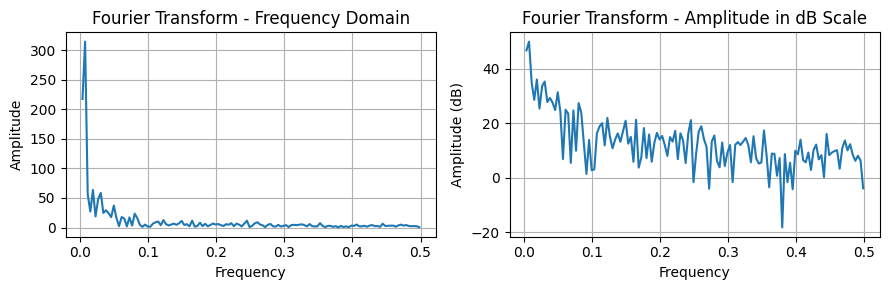

In [ ]:
# Let us look for any seasonality in the data

# Perform FFT
fft_values = np.fft.fft(train_data['Price'])
fft_freq = np.fft.fftfreq(len(fft_values))
# Compute amplitude in dB scale
amplitude_db = 20 * np.log10(np.abs(fft_values))

# We are only interested in the positive frequencies
positive_frequencies = fft_freq > 0
# Plot the FFT results
fig, axs = plt.subplots(1, 2,figsize=(9, 3))

# Plot amplitude
axs[0].plot(fft_freq[positive_frequencies], np.abs(fft_values)[positive_frequencies])
axs[0].set_title("Fourier Transform - Frequency Domain")
axs[0].set_xlabel("Frequency")
axs[0].set_ylabel("Amplitude")
axs[0].grid(True)

# Plot amplitude in dB scale
axs[1].plot(fft_freq[positive_frequencies], amplitude_db[positive_frequencies])
axs[1].set_title("Fourier Transform - Amplitude in dB Scale")
axs[1].set_xlabel("Frequency")
axs[1].set_ylabel("Amplitude (dB)")
axs[1].grid(True)

plt.tight_layout()
plt.show()


Since, there are no spikes in the frequency, there are no seasonal patterns, hence we can use an ARIMA model, as comapred to a SARIMA model, which we can use when our data has seasonality.

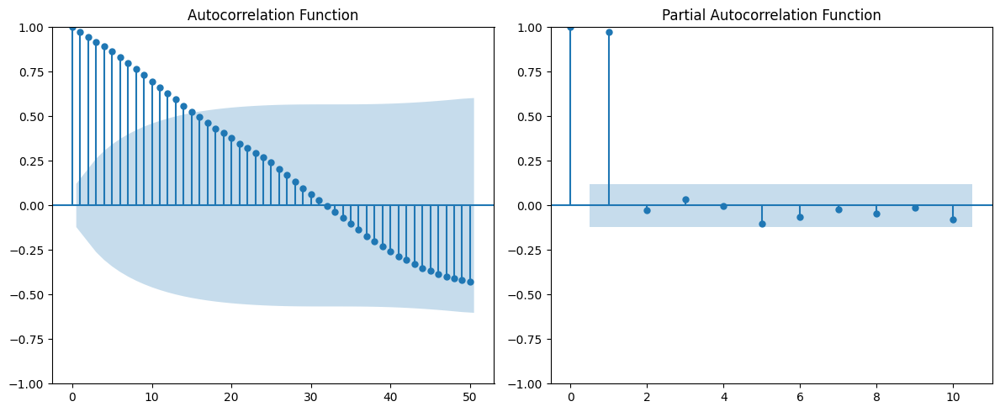

In [ ]:
# Determining the order of the ARIMA model using the ACF and PACF plots
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Plot ACF and PACF in the same plot
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot ACF
plot_acf(train_data["Price"], ax=axes[0], lags=50)
axes[0].set_title('Autocorrelation Function')

# Plot PACF
plot_pacf(train_data["Price"], ax=axes[1], lags=10)
axes[1].set_title('Partial Autocorrelation Function')

plt.tight_layout()
plt.show()

From the autocorrelation plot, we can see that the autocorrelation gradually decreases and does not cut off abruptly. However, the partial autocorrelation plot shows a sharp cut-off after a few lags. This suggests that the data may be an AR(1) process.

We can use ARIMA (1,1,0) or ARIMA (1,1,1) to model our time series. We can will plot the model using ARIMA (1,1,0)

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import pandas as pd

def ts_forecast_arima(data, target_col='Price', forecast_month='December', forecast_year=2020):

    # Ensure the datetime index has a frequency
    if data.index.freq is None:
        data.index.freq = pd.infer_freq(data.index)
    if data.index.freq is None:  # If still None, set to business day frequency
        data.index.freq = 'B'

    # Determine the business days in the forecast month
    forecast_start_date = pd.to_datetime(f'{forecast_year}-{forecast_month}-01')
    forecast_end_date = forecast_start_date + pd.DateOffset(months=1) - pd.DateOffset(days=1)
    forecast_index = pd.date_range(start=forecast_start_date, end=forecast_end_date, freq='B')
    forecast_steps = len(forecast_index)

    # Split data into training and validation sets (last business days of November for December forecasting)
    train_data = data[data.index < forecast_start_date]
    val_data = data[(data.index >= forecast_start_date) & (data.index <= forecast_end_date)]

    # Fit ARIMA(1,1,0)
    model_order = (1, 1, 0)
    arima_model_110 = ARIMA(train_data[target_col], order=model_order)
    arima_results_110 = arima_model_110.fit()
    print('ARIMA(1,1,0) Summary:')
    print(arima_results_110.summary())

    # Plot diagnostics
    arima_results_110.plot_diagnostics(figsize=(8, 6))
    plt.tight_layout()
    plt.show()

    # Initialize a DataFrame to store the forecasts
    forecast_df = pd.DataFrame(index=forecast_index, columns=['Forecast'])

    # Perform rolling forecast
    for i in range(forecast_steps):
        # Forecast the next step
        forecast = arima_results_110.get_forecast(steps=1)
        forecast_df.iloc[i] = forecast.predicted_mean.values

        # Update the model with the new data point
        train_data = pd.concat([train_data, val_data.iloc[[i]]])
        arima_model_110 = ARIMA(train_data[target_col], order=model_order)
        arima_results_110 = arima_model_110.fit(method_kwargs={"maxiter": 200, "disp": 0})

    # Ensure forecast_df has a datetime index
    forecast_df.index = forecast_index

    # Evaluate ARIMA model
    mse_arima = mean_squared_error(val_data[target_col], forecast_df['Forecast'])
    print(f'Mean Squared Error for ARIMA: {mse_arima}')

    # Compute the Bollinger Bands
    rolling_mean = forecast_df['Forecast'].rolling(window=2).mean()
    rolling_std = forecast_df['Forecast'].rolling(window=2).std()
    forecast_df['Upper Band'] = rolling_mean + (rolling_std * 2)
    forecast_df['Lower Band'] = rolling_mean - (rolling_std * 2)

    # Plot the actual vs forecasted values with Bollinger Bands
    plt.figure(figsize=(8, 3))
    plt.plot(data.index, data[target_col], label='Actual')
    plt.plot(forecast_df.index, forecast_df['Forecast'], label='Forecast', linestyle='--')
    plt.fill_between(forecast_df.index, forecast_df['Upper Band'], forecast_df['Lower Band'], color='grey', alpha=0.3, label='Bollinger Bands')
    plt.legend(loc='best')
    plt.title('Rolling Forecast vs Actual with Bollinger Bands')
    plt.show()

ARIMA(1,1,0) Summary:
                               SARIMAX Results                                
Dep. Variable:                  Price   No. Observations:                  238
Model:                 ARIMA(1, 1, 0)   Log Likelihood                -118.189
Date:                Thu, 11 Jul 2024   AIC                            240.378
Time:                        13:44:12   BIC                            247.314
Sample:                    01-02-2020   HQIC                           243.173
                         - 11-30-2020                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0674      0.047      1.437      0.151      -0.025       0.159
sigma2         0.1587      0.011     14.057      0.000       0.137       0.181
Ljung-Box (L1) (Q):           

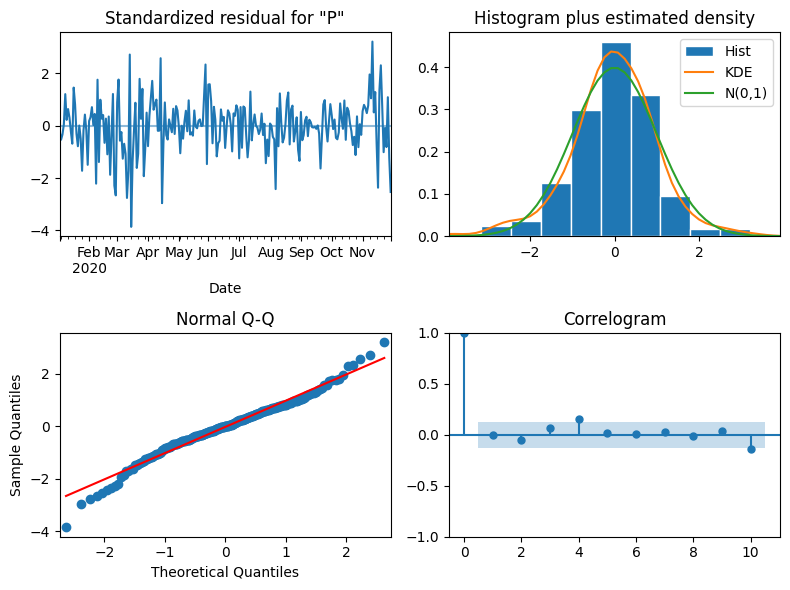

Mean Squared Error for ARIMA: 0.0972210251128867


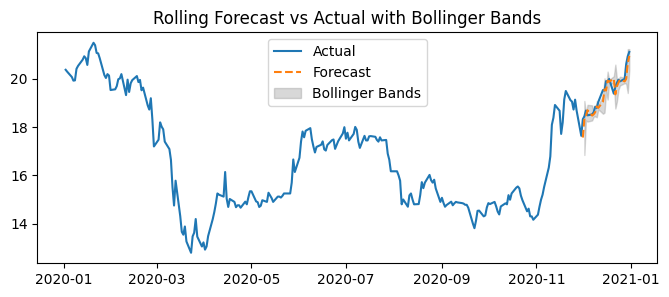

In [ ]:
ts_forecast_arima(train_data)

## **1.2 Using AutoARIMA to automatically find the optimal p,d,q for the ARIMA model**

In [ ]:
import pandas as pd
from pmdarima import auto_arima
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt


def ts_forecast_arima_auto(data, target_col='Price',  forecast_month='December', forecast_year=2020):

    # Ensure the datetime index has a frequency
    if data.index.freq is None:
        data.index.freq = pd.infer_freq(data.index)
    if data.index.freq is None:  # If still None, set to business day frequency
        data.index.freq = 'B'

    # Determine the business days in the forecast month
    forecast_start_date = pd.to_datetime(f'{forecast_year}-{forecast_month}-01')
    forecast_end_date = forecast_start_date + pd.DateOffset(months=1) - pd.DateOffset(days=1)
    forecast_index = pd.date_range(start=forecast_start_date, end=forecast_end_date, freq='B')
    forecast_steps = len(forecast_index)

    # Split data into training and validation sets (last business days of November for December forecasting)
    train_data = data[data.index < forecast_start_date]
    val_data = data[(data.index >= forecast_start_date) & (data.index <= forecast_end_date)]


    # Optimize ARIMA parameters
    auto_arima_model = auto_arima(train_data[target_col],
                                  start_p=0, start_q=0,
                                  max_p=10, max_q=10,
                                  seasonal=False,
                                  trace=True,
                                  error_action='ignore',
                                  suppress_warnings=True,
                                  stepwise=False)

    # Print the optimal order
    print(f'Optimal order: {auto_arima_model.order}')

    # Initialize a DataFrame to store the forecasts
    forecast_df = pd.DataFrame(index=forecast_index, columns=['Forecast'])

    # Perform rolling forecast
    for i in range(forecast_steps):
        # Fit the model on the entire training dataset up to the current point
        model = ARIMA(train_data[target_col],
                      order=auto_arima_model.order)
        results = model.fit(method_kwargs={"maxiter": 200, "disp": 0})

        # Forecast the next step
        forecast = results.forecast(steps=1)
        forecast_df.iloc[i] = forecast.values

        # Append the forecasted value to the training data
        new_train_data = pd.concat([train_data, val_data.iloc[[i]]])
        # Update training data
        train_data = new_train_data

    # Ensure forecast_df has a datetime index
    forecast_df.index = forecast_index

    # Evaluate ARIMA model
    mse_arima = mean_squared_error(val_data[target_col], forecast_df['Forecast'])
    print(f'Mean Squared Error for ARIMA: {mse_arima}')

    # Compute the Bollinger Bands
    rolling_mean = forecast_df['Forecast'].rolling(window=2).mean()
    rolling_std = forecast_df['Forecast'].rolling(window=2).std()
    forecast_df['Upper Band'] = rolling_mean + (rolling_std * 2)
    forecast_df['Lower Band'] = rolling_mean - (rolling_std * 2)

    # Plot the actual vs forecasted values with Bollinger Bands
    plt.figure(figsize=(8, 3))
    plt.plot(data.index, data[target_col], label='Actual')
    plt.plot(forecast_df.index, forecast_df['Forecast'], label='Forecast', linestyle='--')
    plt.fill_between(forecast_df.index, forecast_df['Upper Band'], forecast_df['Lower Band'], color='grey', alpha=0.3, label='Bollinger Bands')
    plt.legend(loc='best')
    plt.title('Rolling Forecast vs Actual with Bollinger Bands')
    plt.show()

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=241.232, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=242.090, Time=0.04 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=243.712, Time=0.06 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=245.036, Time=0.08 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=239.944, Time=0.09 sec
 ARIMA(0,1,5)(0,0,0)[0] intercept   : AIC=241.675, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=242.194, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.08 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=245.069, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=242.896, Time=0.16 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=241.368, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=243.764, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=245.581, Time=0.11 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=246.648, Time=0.27 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept

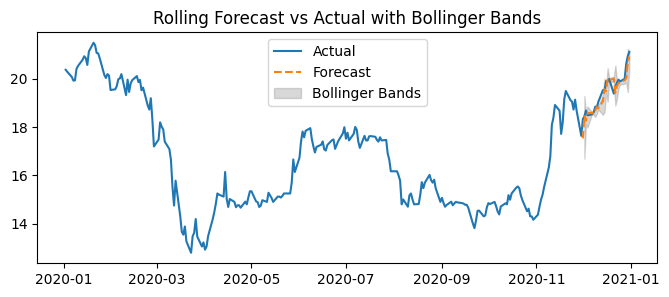

In [ ]:
ts_forecast_arima_auto(train_data)

### **1.3 Using Exogenous variables such as the previous values of the ARIMA model such as the Open, high, low, vol and change cols of the previous days and doing it for all companies.**

In [ ]:
import pandas as pd
from pmdarima import auto_arima
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt
import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.simplefilter('ignore', ConvergenceWarning)

def create_lagged_features(data, target_col, lags=3):
    lagged_data = data.copy()
    for column in data.columns:
        if column != target_col:
            for lag in range(1, lags + 1):
                lagged_data[f'{column}_lag{lag}'] = data[column].shift(lag)
    lagged_data.dropna(inplace=True)  # Drop rows with NaN values caused by lagging
    return lagged_data

def ts_forecast_arimax(sheet_dict, target_col='Price', forecast_month='December', forecast_year=2020, lags=3):
    forecast_results = {}
    models = {}
    performance_metrics = pd.DataFrame(index=sheet_dict.keys(), columns=['MAE', 'RMSE', 'MAPE', 'SMAPE', 'R2 Score'])

    for sheet_name, df in sheet_dict.items():
        print(f"Processing sheet: {sheet_name}")

        # Ensure the datetime index has a frequency
        if df.index.freq is None:
            df.index.freq = pd.infer_freq(df.index)
        if df.index.freq is None:  # If still None, set to business day frequency
            df.index.freq = 'B'

        # Create lagged features for exogenous variables
        df = create_lagged_features(df, target_col, lags)

        # Determine the business days in the forecast month
        forecast_start_date = pd.to_datetime(f'{forecast_year}-{forecast_month}-01')
        forecast_end_date = forecast_start_date + pd.DateOffset(months=1) - pd.DateOffset(days=1)
        forecast_index = pd.date_range(start=forecast_start_date, end=forecast_end_date, freq='B')
        forecast_steps = len(forecast_index)

        # Split data into training and validation sets for forecasting
        train_data = df.loc[df.index < forecast_start_date]
        val_data = df.loc[(df.index >= forecast_start_date) & (df.index <= forecast_end_date)]

        # Prepare lagged exogenous variables
        exog_cols = [col for col in train_data.columns if col != target_col]
        train_exog = train_data[exog_cols]
        val_exog = val_data[exog_cols]

        # Optimize ARIMA parameters with lagged exogenous variables
        auto_arima_model = auto_arima(train_data[target_col],
                                      exogenous=train_exog,
                                      start_p=0, start_q=0,
                                      max_p=10, max_q=10,
                                      seasonal=False,
                                      trace=True,
                                      error_action='ignore',
                                      suppress_warnings=True,
                                      stepwise=False)

        # Print the optimal order
        print(f'Optimal order: {auto_arima_model.order}')

        # Initialize a DataFrame to store the forecasts
        forecast_df = pd.DataFrame(index=forecast_index, columns=['Forecast'])

        # Perform rolling forecast
        for i in range(forecast_steps):
            # Fit the model on the entire training dataset up to the current point
            model = ARIMA(train_data[target_col], order=auto_arima_model.order, exog=train_exog)
            results = model.fit(method_kwargs={"maxiter": 5000, "disp": 0})

            # Forecast the next step using past values of the exogenous variables
            forecast = results.forecast(steps=1, exog=val_exog.iloc[[i]])
            forecast_df.iloc[i] = forecast.values

            # Append the forecasted value to the training data
            new_train_data = pd.concat([train_data, val_data.iloc[[i]]])
            new_train_exog = pd.concat([train_exog, val_exog.iloc[[i]]])

            # Update training data
            train_data = new_train_data
            train_exog = new_train_exog

        # Store the trained model
        models[sheet_name] = model

        # Ensure forecast_df has a datetime index
        forecast_df.index = forecast_index

        # Evaluate ARIMA model
        mse_arima = mean_squared_error(val_data[target_col], forecast_df['Forecast'])
        mae_arima = mean_absolute_error(val_data[target_col], forecast_df['Forecast'])
        r2_arima = r2_score(val_data[target_col], forecast_df['Forecast'])
        mape_arima = np.mean(np.abs((val_data[target_col] - forecast_df['Forecast']) / val_data[target_col])) * 100
        smape_arima = np.mean(2 * np.abs(val_data[target_col] - forecast_df['Forecast']) / (np.abs(val_data[target_col]) + np.abs(forecast_df['Forecast']))) * 100

        # Store performance metrics
        performance_metrics.loc[sheet_name, 'MAE'] = mae_arima
        performance_metrics.loc[sheet_name, 'RMSE'] = np.sqrt(mse_arima)
        performance_metrics.loc[sheet_name, 'MAPE'] = mape_arima
        performance_metrics.loc[sheet_name, 'SMAPE'] = smape_arima
        performance_metrics.loc[sheet_name, 'R2 Score'] = r2_arima

        print(f'Mean Squared Error for {sheet_name} (ARIMAX): {mse_arima}')
        print(f'Mean Absolute Error for {sheet_name} (ARIMAX): {mae_arima}')
        print(f'R2 Score for {sheet_name} (ARIMAX): {r2_arima}')
        print(f'MAPE for {sheet_name} (ARIMAX): {mape_arima}')
        print(f'SMAPE for {sheet_name} (ARIMAX): {smape_arima}')

        # Compute the Bollinger Bands
        rolling_mean = forecast_df['Forecast'].rolling(window=2).mean()
        rolling_std = forecast_df['Forecast'].rolling(window=2).std()
        forecast_df['Upper Band'] = rolling_mean + (rolling_std * 2)
        forecast_df['Lower Band'] = rolling_mean - (rolling_std * 2)

        # Plot the actual vs forecasted values with Bollinger Bands
        plt.figure(figsize=(8, 3))
        plt.plot(train_data.index, train_data[target_col], label='Actual')
        plt.plot(forecast_df.index, forecast_df['Forecast'], label='Forecast', linestyle='--')
        plt.fill_between(forecast_df.index, forecast_df['Upper Band'], forecast_df['Lower Band'], color='grey', alpha=0.3, label='Bollinger Bands')
        plt.legend(loc='best')
        plt.title(f'Rolling Forecast vs Actual with Bollinger Bands for {sheet_name}')
        plt.show()

        forecast_results[sheet_name] = forecast_df

    return forecast_results, performance_metrics, models

Processing sheet: Russia - Sberbank Rossii PAO (S
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1397.968, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1399.878, Time=0.04 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=1401.684, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=1403.585, Time=0.08 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=1389.180, Time=0.13 sec
 ARIMA(0,1,5)(0,0,0)[0] intercept   : AIC=1389.503, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1399.884, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1401.783, Time=0.17 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1403.681, Time=0.20 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=1399.763, Time=0.12 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=1390.136, Time=0.14 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=1401.605, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=1403.453, Time=0.10 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=1392.868, Time=0.25 sec
 ARIMA(2,1,3)(0,0,0)[0] in

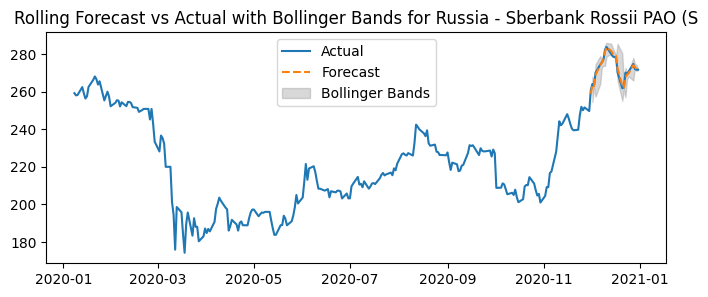

Processing sheet: Turkey - Koc Holding AS (KCHOL)
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=240.788, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=241.699, Time=0.04 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=243.344, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=244.577, Time=0.09 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=239.302, Time=0.11 sec
 ARIMA(0,1,5)(0,0,0)[0] intercept   : AIC=241.018, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=241.795, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=244.539, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=242.167, Time=0.14 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=240.707, Time=0.16 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=243.401, Time=0.04 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=245.212, Time=0.10 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=246.161, Time=0.17 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=in

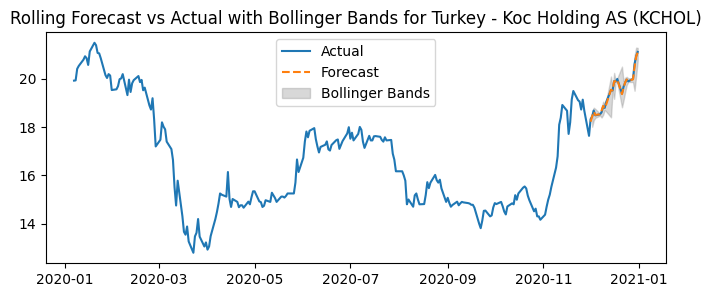

Processing sheet: Egypt - Medinet Nasr Housing (M
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-441.992, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-443.421, Time=0.05 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=-446.410, Time=0.09 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=-444.942, Time=0.11 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=-443.240, Time=0.13 sec
 ARIMA(0,1,5)(0,0,0)[0] intercept   : AIC=-445.215, Time=0.23 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-444.303, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-444.708, Time=0.15 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=-444.735, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=-442.970, Time=0.20 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=-442.220, Time=0.35 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=-445.631, Time=0.08 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=-443.871, Time=0.15 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=-448.010, Time=0.21 sec
 ARIMA(2,1,3)(0,0,0)[0] in

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.p

Mean Squared Error for Egypt - Medinet Nasr Housing (M (ARIMAX): 0.00017843809523529223
Mean Absolute Error for Egypt - Medinet Nasr Housing (M (ARIMAX): 0.010930242227336575
R2 Score for Egypt - Medinet Nasr Housing (M (ARIMAX): 0.9613488852757883
MAPE for Egypt - Medinet Nasr Housing (M (ARIMAX): 0.28933588858262693
SMAPE for Egypt - Medinet Nasr Housing (M (ARIMAX): 0.28946679574331113


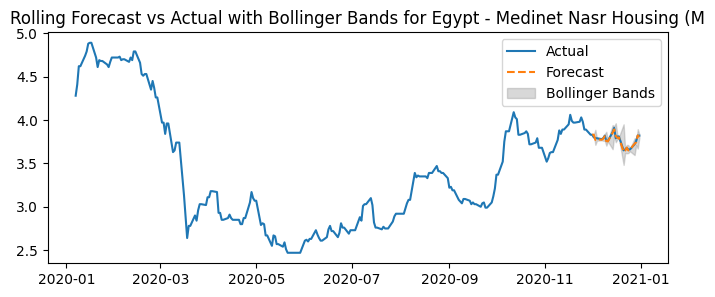

Processing sheet: Brazil - Minerva SABrazil (BEEF
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=261.679, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=262.520, Time=0.04 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=259.286, Time=0.07 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=255.427, Time=0.07 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=256.695, Time=0.16 sec
 ARIMA(0,1,5)(0,0,0)[0] intercept   : AIC=257.774, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=262.242, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=265.177, Time=0.14 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=258.288, Time=0.09 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=257.055, Time=0.11 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=258.390, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=261.526, Time=0.06 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=260.567, Time=0.14 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=253.384, Time=0.17 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.p

Mean Squared Error for Brazil - Minerva SABrazil (BEEF (ARIMAX): 0.0067530271279725
Mean Absolute Error for Brazil - Minerva SABrazil (BEEF (ARIMAX): 0.06003780473660592
R2 Score for Brazil - Minerva SABrazil (BEEF (ARIMAX): 0.8844340559043
MAPE for Brazil - Minerva SABrazil (BEEF (ARIMAX): 0.5892746545303168
SMAPE for Brazil - Minerva SABrazil (BEEF (ARIMAX): 0.5906482389855701


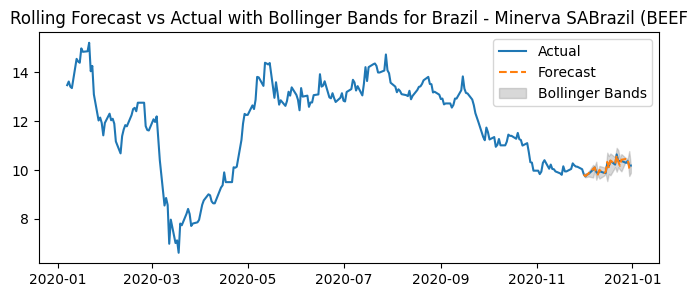

Processing sheet: Argentina - Pampa Energia SA (P
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=987.111, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=987.533, Time=0.04 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=989.169, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=988.470, Time=0.05 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=990.384, Time=0.07 sec
 ARIMA(0,1,5)(0,0,0)[0] intercept   : AIC=992.364, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=987.398, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=990.236, Time=0.08 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=990.392, Time=0.11 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=988.877, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=990.277, Time=0.10 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=991.550, Time=0.20 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=992.38

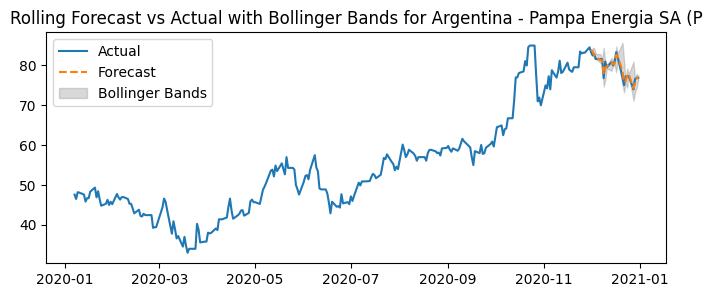

Processing sheet: Colombia - Cementos Argos SA (C
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3033.599, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3035.567, Time=0.06 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3030.334, Time=0.09 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=3031.465, Time=0.11 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=3033.115, Time=0.13 sec
 ARIMA(0,1,5)(0,0,0)[0] intercept   : AIC=3033.776, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3035.557, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3034.801, Time=0.14 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3030.992, Time=0.13 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=3031.959, Time=0.30 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=3033.919, Time=0.32 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3030.198, Time=0.04 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3031.309, Time=0.13 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3032.991, Time=0.18 sec
 ARIMA(2,1,3)(0,0,0)[0] in

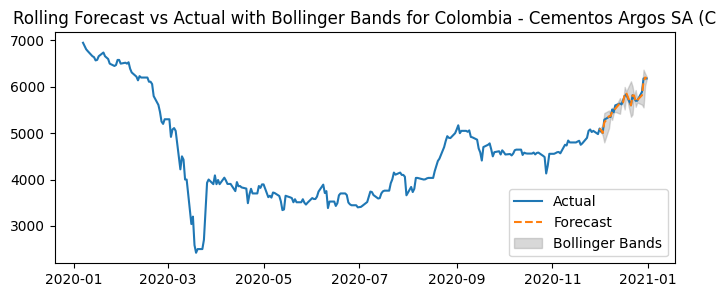

Processing sheet: South Africa - Impala Platinum 
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3701.139, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3703.099, Time=0.03 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3704.910, Time=0.04 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=3703.472, Time=0.07 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=3705.123, Time=0.06 sec
 ARIMA(0,1,5)(0,0,0)[0] intercept   : AIC=3704.716, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3703.095, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3705.130, Time=0.07 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3706.369, Time=0.07 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=3705.289, Time=0.10 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3704.923, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3706.509, Time=0.09 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3697.445, Time=0.25 sec
 ARIMA(2,1,3)(0,0,0)[0] interce

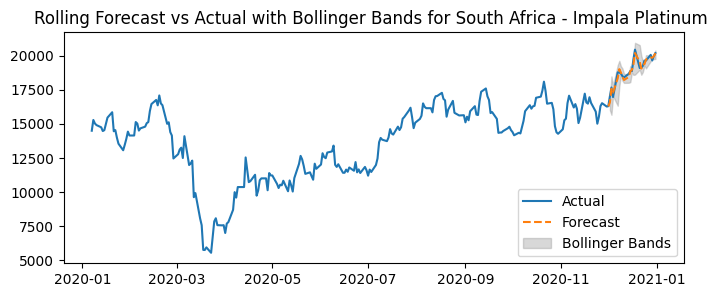

Processing sheet: South Korea - Dongkuk Steel Mil
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3194.377, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3195.508, Time=0.06 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3195.136, Time=0.09 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=3196.713, Time=0.14 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=3197.998, Time=0.12 sec
 ARIMA(0,1,5)(0,0,0)[0] intercept   : AIC=3198.861, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3195.333, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3196.244, Time=0.10 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3196.651, Time=0.14 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=3198.600, Time=0.20 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=3199.731, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3195.123, Time=0.04 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3196.812, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3197.058, Time=0.32 sec
 ARIMA(2,1,3)(0,0,0)[0] in

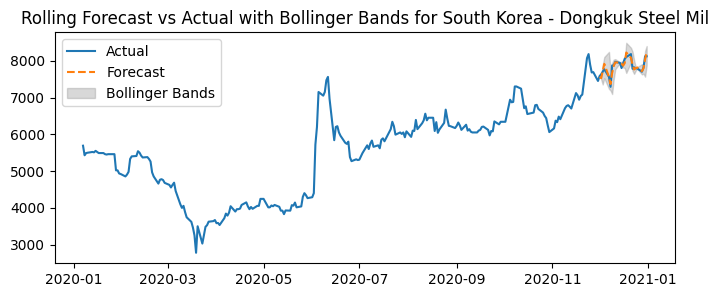

In [ ]:
# Forecast for all sheets and measure performance
results_arimax, performance_metrics_arimax, models_arimax = ts_forecast_arimax(sheet_dict, target_col='Price', forecast_month='December', forecast_year=2020)


In [ ]:
performance_metrics_arimax

,MAE,RMSE,MAPE,SMAPE,R2 Score
Russia - Sberbank Rossii PAO (S,0.857446,1.106888,0.31593,0.315989,0.970977
Turkey - Koc Holding AS (KCHOL),0.03192,0.046292,0.164804,0.165006,0.99655
Egypt - Medinet Nasr Housing (M,0.01093,0.013358,0.289336,0.289467,0.961349
Brazil - Minerva SABrazil (BEEF,0.060038,0.082177,0.589275,0.590648,0.884434
Argentina - Pampa Energia SA (P,0.609921,0.749763,0.771921,0.771833,0.926192
Colombia - Cementos Argos SA (C,31.562067,39.816209,0.557482,0.558223,0.985206
South Africa - Impala Platinum,182.844214,232.217625,0.975621,0.977891,0.95089
South Korea - Dongkuk Steel Mil,68.039524,87.070547,0.864412,0.864757,0.819819


### **1.4 Using Exogenous variables such as the previous values of the ARIMA model such as the Open, high, low, vol and change cols of the previous days as well as the exchange rates and doing it for all companies.**

In [ ]:
# Getting exchange rate information using Exchangerate API from USD to the local currency so we can improve our predictions.

import requests
import pandas as pd
from datetime import datetime, timedelta
from config import API_KEY

#ExchangeRate-API
ER_API_KEY = API_KEY
BASE_URL = 'https://v6.exchangerate-api.com/v6'

def fetch_exchange_rate(date, base_currency='USD' ):
    target_currency=['TRY', 'RUB', 'EGP', 'BRL', 'ARS', 'COP', 'ZAR', 'KRW']
    year = date.year
    month = date.month
    day = date.day
    url = f"{BASE_URL}/{ER_API_KEY}/history/{base_currency}/{year}/{month}/{day}"
    response = requests.get(url)
    data = response.json()
    currency_dict = dict()
    for currency in target_currency:
        if currency not in data['conversion_rates'].keys():
            currency_dict[currency] = None
        else:
            currency_dict[currency] = data['conversion_rates'][currency]
    return currency_dict

def get_exchange_rates_for_year(data, base_currency='USD'):
    start_date = data.index[0]
    end_date = data.index[-1]
    delta = timedelta(days=1)

    dates = []
    rates = pd.DataFrame()

    current_date = start_date
    while current_date <= end_date:
        date_str = current_date.strftime("%Y-%m-%d")
        try:
            rate = fetch_exchange_rate(current_date, base_currency)
            dates.append(date_str)
            rates = pd.concat([rates, pd.DataFrame(rate, index=[date_str])])
        except KeyError:
            # Handle the case where the rate is not available for a specific date
            print(f"Rate not available for {date_str}")
        current_date += delta

    return rates


# Save to CSV
exchange_rates_df = get_exchange_rates_for_year(data,  base_currency='USD')
exchange_rates_df.to_csv('usd_to_cur_2020.csv', index=True)


In [ ]:
import pandas as pd
from pmdarima import auto_arima
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt
import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.simplefilter('ignore', ConvergenceWarning)

def create_lagged_features(data, target_col, lags=3):
    lagged_data = data.copy()
    for column in data.columns:
        if column != target_col:
            for lag in range(1, lags + 1):
                lagged_data[f'{column}_lag{lag}'] = data[column].shift(lag)
    lagged_data.dropna(inplace=True)  # Drop rows with NaN values caused by lagging
    return lagged_data

def ts_forecast_arimax_wexg(sheet_dict, exchange_rates_df, target_col='Price', forecast_month='December', forecast_year=2020, lags=3):
    forecast_results = {}
    models = {}
    performance_metrics = pd.DataFrame(index=sheet_dict.keys(), columns=['MAE', 'RMSE', 'MAPE', 'SMAPE', 'R2 Score'])

    # Ensure exchange_rates_df has a frequency
    if exchange_rates_df.index.freq is None:
        exchange_rates_df.index.freq = pd.infer_freq(exchange_rates_df.index)
    if exchange_rates_df.index.freq is None:
        exchange_rates_df.index.freq = 'B'

    for sheet_name, df in sheet_dict.items():
        print(f"Processing sheet: {sheet_name}")

        # Ensure the datetime index has a frequency
        if df.index.freq is None:
            df.index.freq = pd.infer_freq(df.index)
        if df.index.freq is None:
            df.index.freq = 'B'

        # Merge with exchange_rates_df
        df = df.merge(exchange_rates_df, left_index=True, right_index=True, how='left')

        # Create lagged features for exogenous variables
        df = create_lagged_features(df, target_col, lags)

        # Determine the business days in the forecast month
        forecast_start_date = pd.to_datetime(f'{forecast_year}-{forecast_month}-01')
        forecast_end_date = forecast_start_date + pd.DateOffset(months=1) - pd.DateOffset(days=1)
        forecast_index = pd.date_range(start=forecast_start_date, end=forecast_end_date, freq='B')
        forecast_steps = len(forecast_index)

        # Split data into training and validation sets
        train_data = df.loc[df.index < forecast_start_date]
        val_data = df.loc[(df.index >= forecast_start_date) & (df.index <= forecast_end_date)]

        # Prepare lagged exogenous variables
        exog_cols = [col for col in train_data.columns if col != target_col]
        train_exog = train_data[exog_cols]
        val_exog = val_data[exog_cols]

        # Optimize ARIMA parameters with lagged exogenous variables
        auto_arima_model = auto_arima(train_data[target_col],
                                      exogenous=train_exog,
                                      start_p=0, start_q=0,
                                      max_p=10, max_q=10,
                                      seasonal=False,
                                      trace=True,
                                      error_action='ignore',
                                      suppress_warnings=True,
                                      stepwise=False)

        # Print the optimal order
        print(f'Optimal order: {auto_arima_model.order}')

        # Initialize a DataFrame to store the forecasts
        forecast_df = pd.DataFrame(index=forecast_index, columns=['Forecast'])

        # Perform rolling forecast
        for i in range(forecast_steps):
            # Fit the model on the entire training dataset up to the current point
            model = ARIMA(train_data[target_col], order=auto_arima_model.order, exog=train_exog)
            results = model.fit(method_kwargs={"maxiter": 5000, "disp": 0})

            # Forecast the next step using past values of the exogenous variables
            forecast = results.forecast(steps=1, exog=val_exog.iloc[[i]])
            forecast_df.iloc[i] = forecast.values

            # Append the plast value to the train data
            new_train_data = pd.concat([train_data, val_data.iloc[[i]]])
            new_train_exog = pd.concat([train_exog, val_exog.iloc[[i]]])

            # Update training data
            train_data = new_train_data
            train_exog = new_train_exog

        # Store the trained model
        models[sheet_name] = model
        # Ensure forecast_df has a datetime index
        forecast_df.index = forecast_index

        # Evaluate ARIMA model
        mse_arima = mean_squared_error(val_data[target_col], forecast_df['Forecast'])
        mae_arima = mean_absolute_error(val_data[target_col], forecast_df['Forecast'])
        r2_arima = r2_score(val_data[target_col], forecast_df['Forecast'])
        mape_arima = np.mean(np.abs((val_data[target_col] - forecast_df['Forecast']) / val_data[target_col])) * 100
        smape_arima = np.mean(2 * np.abs(val_data[target_col] - forecast_df['Forecast']) / (np.abs(val_data[target_col]) + np.abs(forecast_df['Forecast']))) * 100

        # Store performance metrics
        performance_metrics.loc[sheet_name, 'MAE'] = mae_arima
        performance_metrics.loc[sheet_name, 'RMSE'] = np.sqrt(mse_arima)
        performance_metrics.loc[sheet_name, 'MAPE'] = mape_arima
        performance_metrics.loc[sheet_name, 'SMAPE'] = smape_arima
        performance_metrics.loc[sheet_name, 'R2 Score'] = r2_arima

        # Compute the Bollinger Bands
        rolling_mean = forecast_df['Forecast'].rolling(window=2).mean()
        rolling_std = forecast_df['Forecast'].rolling(window=2).std()
        forecast_df['Upper Band'] = rolling_mean + (rolling_std * 2)
        forecast_df['Lower Band'] = rolling_mean - (rolling_std * 2)

        # Plot the actual vs forecasted values with Bollinger Bands
        plt.figure(figsize=(8, 3))
        plt.plot(train_data.index, train_data[target_col], label='Actual')
        plt.plot(forecast_df.index, forecast_df['Forecast'], label='Forecast', linestyle='--')
        plt.fill_between(forecast_df.index, forecast_df['Upper Band'], forecast_df['Lower Band'], color='grey', alpha=0.3, label='Bollinger Bands')
        plt.legend(loc='best')
        plt.title(f'Rolling Forecast vs Actual with Bollinger Bands for {sheet_name}')
        plt.show()

        forecast_results[sheet_name] = forecast_df

    return forecast_results, performance_metrics, models

Processing sheet: Russia - Sberbank Rossii PAO (S
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1397.968, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1399.878, Time=0.04 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=1401.684, Time=0.07 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=1403.585, Time=0.09 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=1389.180, Time=0.13 sec
 ARIMA(0,1,5)(0,0,0)[0] intercept   : AIC=1389.503, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1399.884, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1401.783, Time=0.16 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1403.681, Time=0.21 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=1399.763, Time=0.13 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=1390.136, Time=0.14 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=1401.605, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=1403.453, Time=0.10 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=1392.868, Time=0.25 sec
 ARIMA(2,1,3)(0,0,0)[0] in

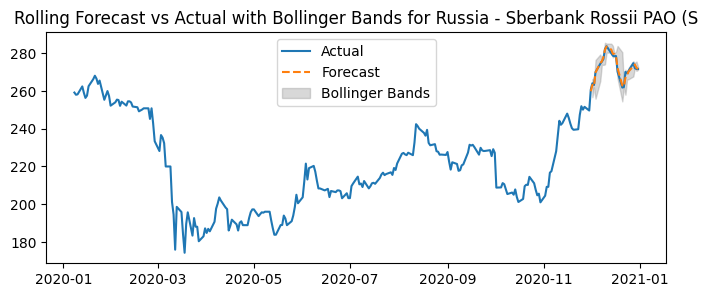

Processing sheet: Turkey - Koc Holding AS (KCHOL)
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=240.788, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=241.699, Time=0.04 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=243.344, Time=0.07 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=244.577, Time=0.08 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=239.302, Time=0.09 sec
 ARIMA(0,1,5)(0,0,0)[0] intercept   : AIC=241.018, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=241.795, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=244.539, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=242.167, Time=0.14 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=240.707, Time=0.16 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=243.401, Time=0.04 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=245.212, Time=0.10 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=246.161, Time=0.18 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=in

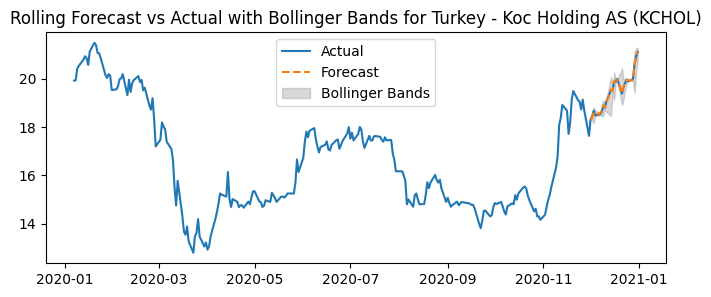

Processing sheet: Egypt - Medinet Nasr Housing (M
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-441.992, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-443.421, Time=0.05 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=-446.410, Time=0.10 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=-444.942, Time=0.13 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=-443.240, Time=0.14 sec
 ARIMA(0,1,5)(0,0,0)[0] intercept   : AIC=-445.215, Time=0.20 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-444.303, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-444.708, Time=0.15 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=-444.735, Time=0.18 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=-442.970, Time=0.21 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=-442.220, Time=0.35 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=-445.631, Time=0.09 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=-443.871, Time=0.15 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=-448.010, Time=0.21 sec
 ARIMA(2,1,3)(0,0,0)[0] in

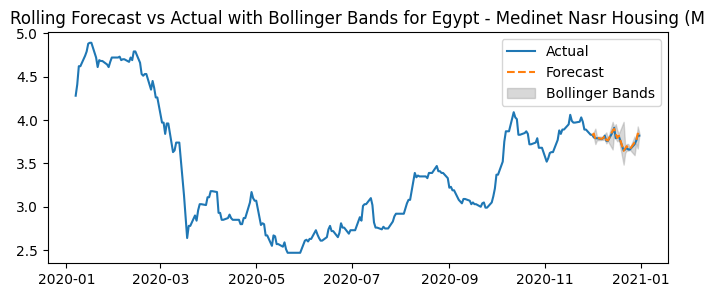

Processing sheet: Brazil - Minerva SABrazil (BEEF
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=261.679, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=262.520, Time=0.04 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=259.286, Time=0.07 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=255.427, Time=0.06 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=256.695, Time=0.16 sec
 ARIMA(0,1,5)(0,0,0)[0] intercept   : AIC=257.774, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=262.242, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=265.177, Time=0.13 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=258.288, Time=0.09 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=257.055, Time=0.10 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=258.390, Time=0.17 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=261.526, Time=0.06 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=260.567, Time=0.14 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=253.384, Time=0.17 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.p

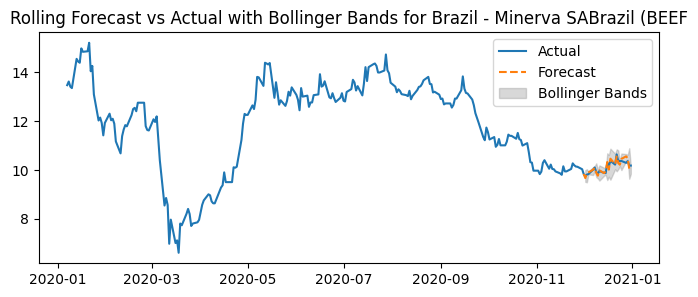

Processing sheet: Argentina - Pampa Energia SA (P
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=987.111, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=987.533, Time=0.04 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=989.169, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=988.470, Time=0.06 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=990.384, Time=0.07 sec
 ARIMA(0,1,5)(0,0,0)[0] intercept   : AIC=992.364, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=987.398, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=990.236, Time=0.09 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=990.392, Time=0.12 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=988.877, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=990.277, Time=0.11 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=991.550, Time=0.21 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=992.38

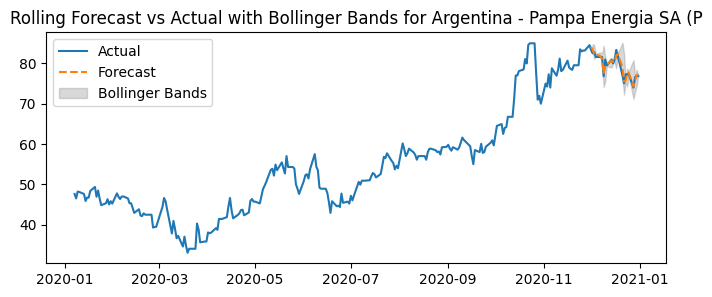

Processing sheet: Colombia - Cementos Argos SA (C
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3033.599, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3035.567, Time=0.06 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3030.334, Time=0.08 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=3031.465, Time=0.10 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=3033.115, Time=0.14 sec
 ARIMA(0,1,5)(0,0,0)[0] intercept   : AIC=3033.776, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3035.557, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3034.801, Time=0.14 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3030.992, Time=0.13 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=3031.959, Time=0.31 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=3033.919, Time=0.33 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3030.198, Time=0.04 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3031.309, Time=0.12 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3032.991, Time=0.18 sec
 ARIMA(2,1,3)(0,0,0)[0] in

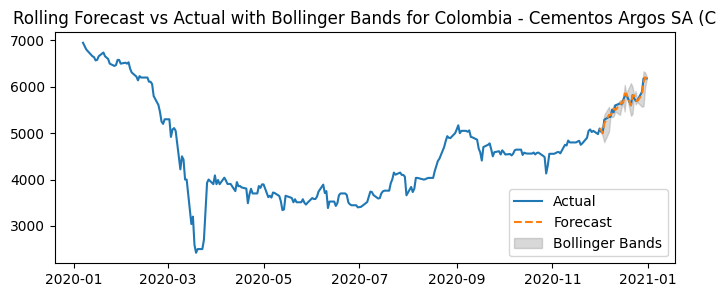

Processing sheet: South Africa - Impala Platinum 
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3701.139, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3703.099, Time=0.04 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3704.910, Time=0.04 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=3703.472, Time=0.06 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=3705.123, Time=0.06 sec
 ARIMA(0,1,5)(0,0,0)[0] intercept   : AIC=3704.716, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3703.095, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3705.130, Time=0.07 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3706.369, Time=0.07 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=3705.289, Time=0.10 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3704.923, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3706.509, Time=0.09 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3697.445, Time=0.25 sec
 ARIMA(2,1,3)(0,0,0)[0] interce

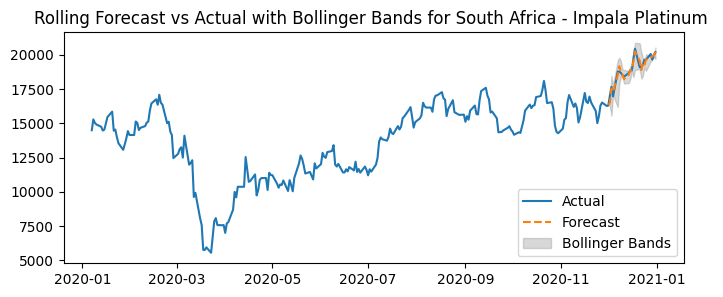

Processing sheet: South Korea - Dongkuk Steel Mil
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3194.377, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3195.508, Time=0.06 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3195.136, Time=0.09 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=3196.713, Time=0.12 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=3197.998, Time=0.14 sec
 ARIMA(0,1,5)(0,0,0)[0] intercept   : AIC=3198.861, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3195.333, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3196.244, Time=0.10 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3196.651, Time=0.13 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=3198.600, Time=0.19 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=3199.731, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3195.123, Time=0.04 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3196.812, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3197.058, Time=0.32 sec
 ARIMA(2,1,3)(0,0,0)[0] in

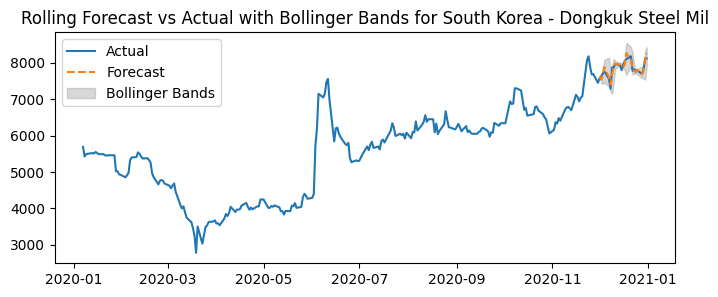

In [ ]:
# Load the exchange rates data
exchange_rates_df = pd.read_csv('/content/gdrive/My Drive/usd_to_cur_2020.csv', index_col='Date', parse_dates=True)

# Forecast for all sheets and measure performance
results_arimax_wexg, performance_metrics_arimax_wexg, models_arimax_wexg = ts_forecast_arimax_wexg(sheet_dict, exchange_rates_df, target_col='Price', forecast_month='December', forecast_year=2020)

In [ ]:
 performance_metrics_arimax_wexg

,MAE,RMSE,MAPE,SMAPE,R2 Score
Russia - Sberbank Rossii PAO (S,0.924462,1.18826,0.340182,0.340169,0.966553
Turkey - Koc Holding AS (KCHOL),0.033983,0.040156,0.176834,0.176852,0.997404
Egypt - Medinet Nasr Housing (M,0.013541,0.017783,0.358459,0.357542,0.931498
Brazil - Minerva SABrazil (BEEF,0.083234,0.108192,0.816683,0.817466,0.799682
Argentina - Pampa Energia SA (P,0.664229,0.83507,0.835859,0.835907,0.908441
Colombia - Cementos Argos SA (C,41.3668,51.413962,0.736,0.737044,0.975332
South Africa - Impala Platinum,196.604548,246.191198,1.050214,1.051551,0.944802
South Korea - Dongkuk Steel Mil,70.502292,86.732662,0.897802,0.897001,0.821215


### **2 Using LSTM to predict the next days price and doing it for all companies.**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping

# Create sequences
def create_sequences(data, seq_length):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i + seq_length, :])
        y.append(data[i + seq_length, 0])  # Adjust to use the first column, assuming single feature
    return np.array(X), np.array(y)

def ts_forecast_lstm(sheet_dict, target_col='Price', forecast_month='December', forecast_year=2020, seq_length=5):
    forecast_results = {}
    models = {}
    performance_metrics = pd.DataFrame(index=sheet_dict.keys(), columns=['MAE', 'RMSE', 'MAPE', 'SMAPE', 'R2 Score'])

    for sheet_name, df in sheet_dict.items():
        print(f"Processing sheet: {sheet_name}")

        # Ensure the datetime index has a frequency
        if df.index.freq is None:
            df.index.freq = pd.infer_freq(df.index)
        if df.index.freq is None:  # If still None, set to business day frequency
            df.index.freq = 'B'

        # Determine the business days in the forecast month
        forecast_start_date = pd.to_datetime(f'{forecast_year}-{forecast_month}-01')
        forecast_end_date = forecast_start_date + pd.DateOffset(months=1) - pd.DateOffset(days=1)
        forecast_index = pd.date_range(start=forecast_start_date, end=forecast_end_date, freq='B')
        forecast_steps = len(forecast_index)

        # Split data into training and validation sets for forecasting
        train_data = df.loc[df.index < forecast_start_date]
        val_data = df.loc[(df.index >= forecast_start_date) & (df.index <= forecast_end_date)]

        # Scale the data
        scaler = MinMaxScaler()
        scaled_train = scaler.fit_transform(train_data[[target_col]])
        scaled_val = scaler.transform(val_data[[target_col]])

        # Prepare sequences
        X_train, y_train = create_sequences(scaled_train, seq_length)

        # Split the training data into training and early stopping validation sets
        early_stop_val_split = int(len(X_train) * 0.8)
        X_train_main, X_train_early_stop = X_train[:early_stop_val_split], X_train[early_stop_val_split:]
        y_train_main, y_train_early_stop = y_train[:early_stop_val_split], y_train[early_stop_val_split:]


        # Build the LSTM model
        def build_lstm_model(input_shape):
          lstm_model = Sequential()

          # First LSTM layer with dropout
          lstm_model.add(LSTM(50, return_sequences=True, input_shape=input_shape))
          lstm_model.add(Dropout(0.2))

          # Second LSTM layer with dropout
          lstm_model.add(LSTM(50, return_sequences=True))
          lstm_model.add(Dropout(0.2))

          # Third LSTM layer with dropout
          lstm_model.add(LSTM(50))
          lstm_model.add(Dropout(0.2))

          # Output layer
          lstm_model.add(Dense(1))
          lstm_model.compile(optimizer='adam', loss='mean_squared_error')

          return lstm_model

        # Instantiate the LSTM model
        model_lstm = build_lstm_model(input_shape=(X_train_main.shape[1], X_train_main.shape[2]))

        # Add early stopping callback
        early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

        # Model fitting
        model_lstm.fit(X_train_main, y_train_main, epochs=100, batch_size= 24, validation_data=(X_train_early_stop, y_train_early_stop), callbacks=[early_stopping], verbose=0)

        # Store the trained model
        models[sheet_name] = model_lstm

        # Initialize a DataFrame to store the forecasts
        forecast_df = pd.DataFrame(index=forecast_index, columns=['Forecast'])

        # Perform rolling forecast
        last_sequence = scaled_train[-seq_length:]  # Get the last sequence from the training data

        for i in range(forecast_steps):
            X_last = np.expand_dims(last_sequence, axis=0)  # Shape to (1, seq_length, num_features)
            y_pred = model_lstm.predict(X_last)[0, 0]  # Predict the next value

            # Append the forecasted value to the forecast DataFrame
            forecast_df.iloc[i] = y_pred

            # Update the last sequence with the true value from the validation set
            if i < len(scaled_val):
                new_sequence = np.append(last_sequence[1:], scaled_val[i].reshape(1, -1), axis=0)
                last_sequence = new_sequence

        # Inverse transform to the original scale
        forecast_df["Forecast"] = scaler.inverse_transform(forecast_df[["Forecast"]].values).flatten()


        # Evaluate the model
        mse_lstm = mean_squared_error(val_data[target_col], forecast_df["Forecast"])
        mae_lstm = mean_absolute_error(val_data[target_col], forecast_df["Forecast"])
        r2_lstm = r2_score(val_data[target_col], forecast_df["Forecast"])
        mape_lstm = np.mean(np.abs((val_data[target_col] - forecast_df["Forecast"]) / val_data[target_col])) * 100
        smape_lstm = np.mean(2 * np.abs(val_data[target_col] - forecast_df["Forecast"]) / (np.abs(val_data[target_col]) + np.abs(forecast_df["Forecast"]))) * 100

        # Store performance metrics
        performance_metrics.loc[sheet_name, 'MAE'] = mae_lstm
        performance_metrics.loc[sheet_name, 'RMSE'] = np.sqrt(mse_lstm)
        performance_metrics.loc[sheet_name, 'MAPE'] = mape_lstm
        performance_metrics.loc[sheet_name, 'SMAPE'] = smape_lstm
        performance_metrics.loc[sheet_name, 'R2 Score'] = r2_lstm


        # Compute the Bollinger Bands
        rolling_mean = forecast_df['Forecast'].rolling(window=2).mean()
        rolling_std = forecast_df['Forecast'].rolling(window=2).std()
        forecast_df['Upper Band'] = rolling_mean + (rolling_std * 2)
        forecast_df['Lower Band'] = rolling_mean - (rolling_std * 2)

        # Plot the actual vs forecasted values with Bollinger Bands
        plt.figure(figsize=(8, 3))
        combined_data = pd.concat([train_data[target_col], val_data[target_col]])
        plt.plot(combined_data.index, combined_data, label='Actual')
        plt.plot(forecast_df.index, forecast_df['Forecast'], label='Forecast', linestyle='--')
        plt.fill_between(forecast_df.index, forecast_df['Upper Band'], forecast_df['Lower Band'], color='grey', alpha=0.3, label='Bollinger Bands')
        plt.legend(loc='best')
        plt.title(f'Rolling Forecast vs Actual with Bollinger Bands for {sheet_name}')
        plt.show()

        forecast_results[sheet_name] = forecast_df

    return forecast_results, performance_metrics, models

Processing sheet: Russia - Sberbank Rossii PAO (S
1/1 [==============================] - 0s 22ms/step


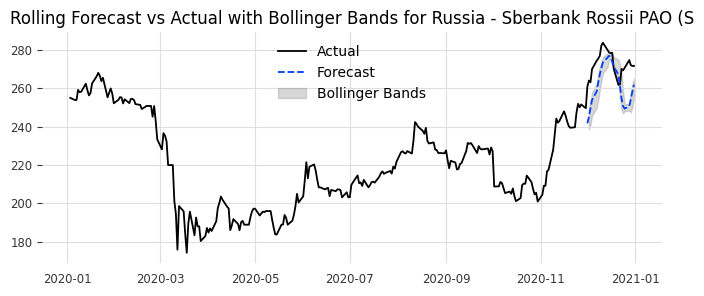

Processing sheet: Turkey - Koc Holding AS (KCHOL)
1/1 [==============================] - 0s 24ms/step


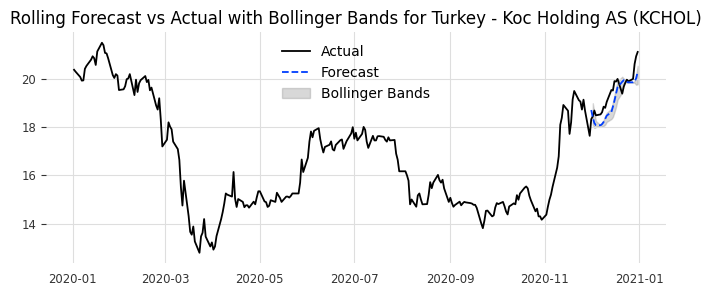

Processing sheet: Egypt - Medinet Nasr Housing (M
1/1 [==============================] - 0s 23ms/step


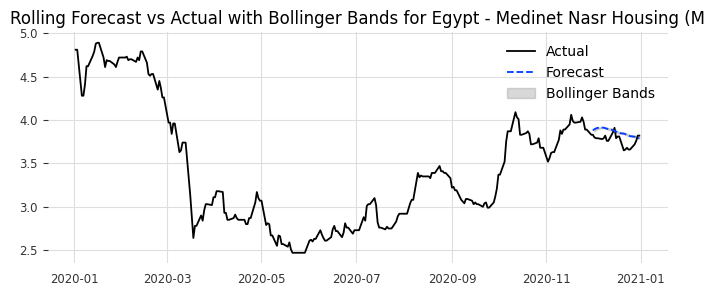

Processing sheet: Brazil - Minerva SABrazil (BEEF
1/1 [==============================] - 0s 22ms/step


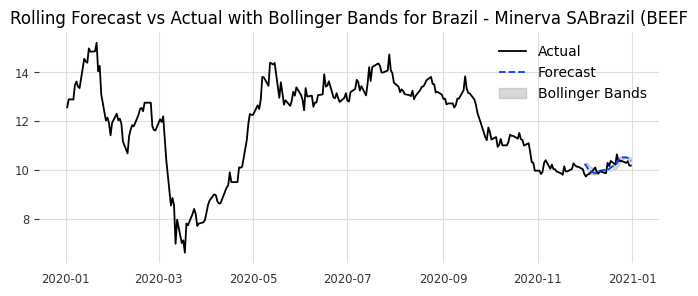

Processing sheet: Argentina - Pampa Energia SA (P
1/1 [==============================] - 0s 23ms/step


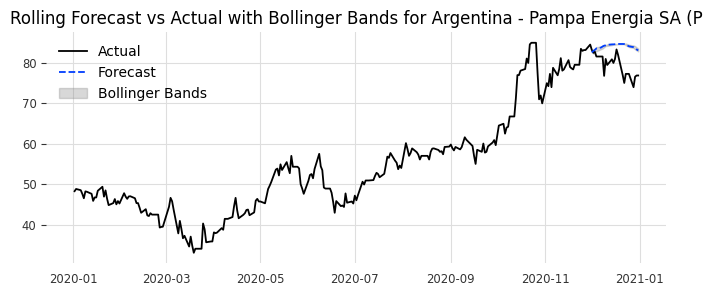

Processing sheet: Colombia - Cementos Argos SA (C
1/1 [==============================] - 0s 24ms/step


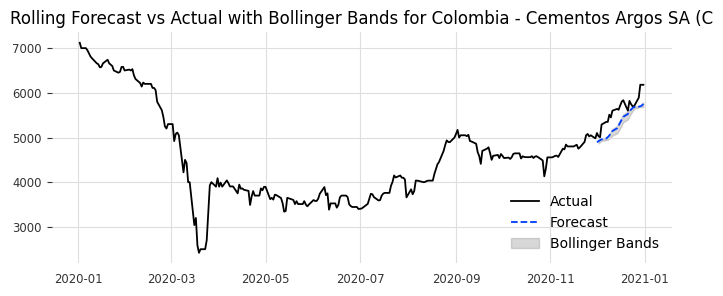

Processing sheet: South Africa - Impala Platinum 
1/1 [==============================] - 0s 23ms/step


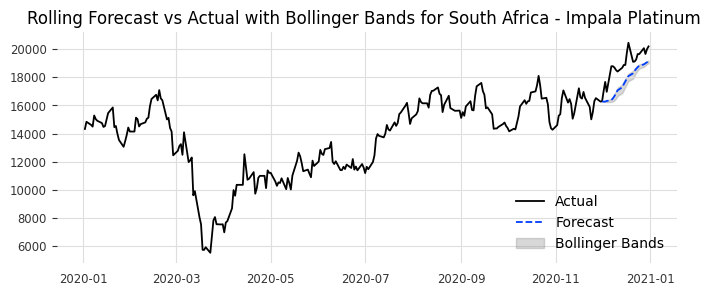

Processing sheet: South Korea - Dongkuk Steel Mil
1/1 [==============================] - 0s 23ms/step


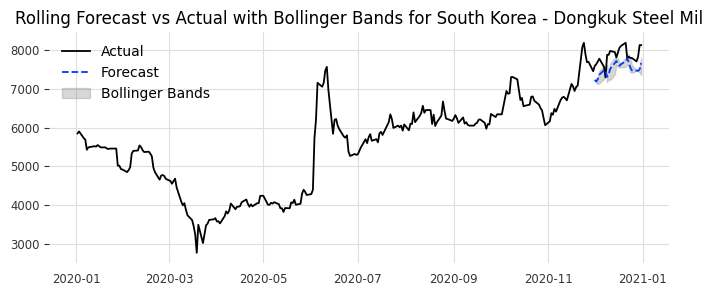

In [ ]:
results_lstm, performance_metrics_lstm, models_lstm = ts_forecast_lstm(sheet_dict, target_col='Price', forecast_month='December', forecast_year=2020, seq_length = 20)


In [ ]:
performance_metrics_lstm

,MAE,RMSE,MAPE,SMAPE,R2 Score
Russia - Sberbank Rossii PAO (S,6.26418,7.155121,2.319453,2.323518,-0.212733
Turkey - Koc Holding AS (KCHOL),0.641759,0.704954,3.275087,3.339236,0.199996
Egypt - Medinet Nasr Housing (M,0.073712,0.093195,1.947285,1.972777,-0.881308
Brazil - Minerva SABrazil (BEEF,0.185819,0.2383,1.81847,1.83656,0.028198
Argentina - Pampa Energia SA (P,3.610347,4.181219,4.6307,4.489229,-1.295422
Colombia - Cementos Argos SA (C,298.380781,329.613339,5.247983,5.418983,-0.013881
South Africa - Impala Platinum,711.969776,875.013627,3.751788,3.858934,0.302713
South Korea - Dongkuk Steel Mil,207.766332,251.74421,2.627908,2.670664,-0.506207


## **3. Timeseries forecasting using DARTS**

### **3.1 Using the DARTS toolbox to implement the VARIMA model which we use to model all timeseires. However VARIMA implementation in DARTS do not use past exogewous variales/covariates**

In [ ]:
# VARIMA model
from darts.metrics import mae, rmse, mape, smape, mase, r2_score
from darts.dataprocessing.transformers import Scaler
from darts.models.forecasting.varima import VARIMA
from darts import TimeSeries
from darts import concatenate
import pandas as pd
import matplotlib.pyplot as plt
import logging
logging.getLogger("pytorch_lightning.utilities.rank_zero").setLevel(logging.WARNING)
logging.getLogger("pytorch_lightning.accelerators.cuda").setLevel(logging.WARNING)


# align list of time series into multivariate timeseries
def align_timeseries(ts_list):
    # Convert TimeSeries to DataFrame to align them
    df_list = [ts.pd_dataframe() for ts in ts_list]

    # Find the common time index
    common_time_index = df_list[0].index
    for df in df_list[1:]:
        common_time_index = common_time_index.intersection(df.index)

    # Align all DataFrames to the common time index
    aligned_df_list = [df.reindex(common_time_index) for df in df_list]

    # Convert DataFrames back to TimeSeries
    aligned_ts_list = [TimeSeries.from_dataframe(df) for df in aligned_df_list]

    return aligned_ts_list


def ts_forecast_darts_VARIMA(sheet_dict, target_col='Price', val_month='December', val_year=2020):

  # Determine the business days in the validation data
  val_start_date = pd.Timestamp(f'{val_year}-{val_month}-01')
  val_end_date = pd.Timestamp(f'{val_year}-{val_month}-01')+ pd.DateOffset(months=1) - pd.DateOffset(days=1)
  val_index = pd.date_range(start=val_start_date, end=val_end_date, freq='B')
  val_steps = len(val_index)

  # Initialize empty lists for series
  target_series = []
  exog_series= []
  train_series= []

  val_series= []

 # Initalize results
  forecast_results = {}
  models = {}
  performance_metrics = pd.DataFrame(index=sheet_dict.keys(), columns=['MAE', 'RMSE', 'MAPE', 'SMAPE', 'MASE', 'R2 Score'])
  for company, df_comp in sheet_dict.items():
      # Sort the DataFrame
      df_comp.sort_index(ascending=True, inplace=True)

      # split data into trainig and validation
      tseries= TimeSeries.from_series(df_comp[[target_col]])
      train_series_comp, val_series_comp =  tseries.split_before(val_start_date)
      val_series_comp = val_series_comp.drop_after(val_end_date)
      target_series.append(tseries)
      train_series.append(train_series_comp)
      val_series.append(val_series_comp)


  train_series = align_timeseries(train_series)
  val_series = align_timeseries(val_series)
  target_series = align_timeseries(target_series)
  train_series = concatenate(train_series, axis=1)
  val_series = concatenate(val_series, axis=1)
  target_series = concatenate(target_series, axis=1)

  # Scale the data
  scaler_target = Scaler()
  train_series_scaled = scaler_target.fit_transform(train_series)
  val_series_scaled = scaler_target.transform(val_series)


# Define and train the VARIMA model
  model = VARIMA(p=1, d=1, q=1)
  model.fit(train_series_scaled)
  pred_series_scaled = model.predict(1, num_samples=100)

# Perform rolling forecast
  for i in range(val_steps-1):
    new_train_val, val_series_scaled = val_series_scaled.split_after(val_index[i])
    train_series_scaled = train_series_scaled.append(new_train_val)
    # Fit the model on the entire training dataset up to the current point
    model = VARIMA(p=1, d=1, q=1)
    model.fit(train_series_scaled)
    pred_val_scaled = model.predict(1, num_samples=100)
    pred_series_scaled = pred_series_scaled.append(pred_val_scaled)

  # Model
  models['model'] = model
  models['scale_target'] = scaler_target

  # Unscaled forecast
  pred_series = scaler_target.inverse_transform(pred_series_scaled)
  pred_series = [pred_series.univariate_component(i) for i in range(pred_series.width)]
  val_series= [val_series.univariate_component(i) for i in range(val_series.width)]
  train_series = [train_series.univariate_component(i) for i in range(train_series.width)]

  # Evaluate the performance of the model
  # Plotting and saving the forecast results
  plt.figure(figsize=(20, 15))
  for i, company in enumerate(sheet_dict.keys()):
    forecasts_df = pd.DataFrame(index=val_index, columns=['Forecast', 'Upper bound (75%ile)', 'Lower bound (25%ile)'])
    forecasts_df['Forecast'] = pred_series[i].median().pd_series()
    forecasts_df['Upper bound (75%ile)'] = pred_series[i].quantile(0.75).pd_series()
    forecasts_df['Lower bound (25%ile)'] = pred_series[i].quantile(0.25).pd_series()
    forecast_results[company] = forecasts_df
    plt.subplot((len(sheet_dict.keys()) + 1) // 2, 2, i + 1)
    train_series[i].plot(label="Train Data")
    val_series[i].plot(label="Actual")
    pred_series[i].plot(label="Forecast")
    plt.title(f'VARIMA Forecast for {company}')
    plt.legend()
  plt.tight_layout()
  plt.show()

  # Evaluate the performance of the model

  for i, company in enumerate(sheet_dict.keys()):
      performance_metrics.loc[company, 'MAE'] = mae(val_series[i], pred_series[i])
      performance_metrics.loc[company, 'RMSE'] = rmse(val_series[i], pred_series[i])
      performance_metrics.loc[company, 'MAPE'] = mape(val_series[i], pred_series[i])
      performance_metrics.loc[company, 'SMAPE'] = smape(val_series[i], pred_series[i])
      performance_metrics.loc[company, 'MASE'] = mase(val_series[i], pred_series[i], train_series[i])
      performance_metrics.loc[company, 'R2 Score'] = r2_score(val_series[i], pred_series[i])

  return forecast_results, performance_metrics, models


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/varmax.py:160: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/varmax.py:160: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/pyt

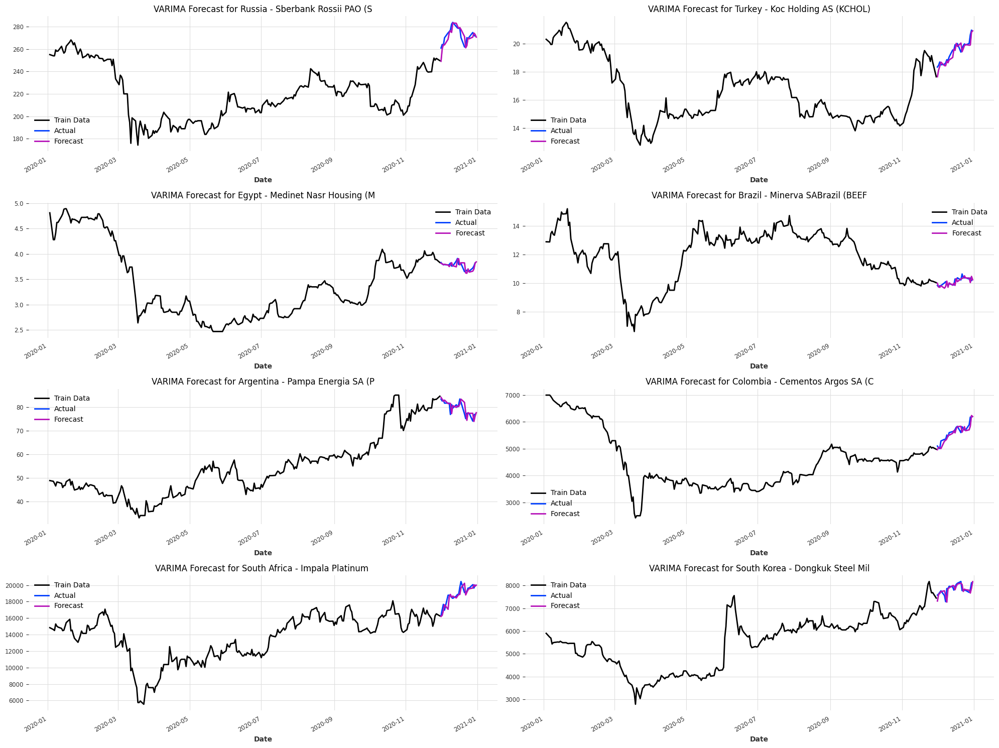

In [ ]:
forecast_results_varima, performance_metrics_varima, model_varima = ts_forecast_darts_VARIMA(sheet_dict, target_col='Price', val_month='December', val_year=2020)

In [ ]:
performance_metrics_varima

,MAE,RMSE,MAPE,SMAPE,MASE,R2 Score
Russia - Sberbank Rossii PAO (S,3.543522,4.832379,1.313944,1.320221,1.077877,0.470725
Turkey - Koc Holding AS (KCHOL),0.265947,0.333583,1.373602,1.382929,0.890263,0.786919
Egypt - Medinet Nasr Housing (M,0.042011,0.060336,1.121675,1.118148,0.717404,0.227382
Brazil - Minerva SABrazil (BEEF,0.167068,0.212366,1.642796,1.654374,0.575508,0.25911
Argentina - Pampa Energia SA (P,1.65385,2.207568,2.113038,2.101128,1.152543,0.364161
Colombia - Cementos Argos SA (C,108.17083,139.870909,1.917621,1.936428,1.151169,0.798739
South Africa - Impala Platinum,423.915186,593.185108,2.260552,2.285921,0.877756,0.6703
South Korea - Dongkuk Steel Mil,135.520252,189.306583,1.743101,1.753987,1.0048,0.106291


### **3.2 Using the DARTS toolbox to implement the XGBoost model.**

In [ ]:
from darts.metrics import mae, rmse, mape, smape, mase, r2_score
from darts.dataprocessing.transformers import Scaler
from darts.models.forecasting.xgboost import XGBModel
from darts import TimeSeries
import pandas as pd
import matplotlib.pyplot as plt
import logging
from darts import concatenate
from darts.utils.likelihood_models import GaussianLikelihood, LaplaceLikelihood

logging.getLogger("pytorch_lightning.utilities.rank_zero").setLevel(logging.WARNING)
logging.getLogger("pytorch_lightning.accelerators.cuda").setLevel(logging.WARNING)

def ts_forecast_darts_XGB(sheet_dict, target_col='Price', past_covariates_df = exchange_rates_df, val_month='December', val_year=2020):

  # Determine the business days in the validation data
  val_start_date = pd.Timestamp(f'{val_year}-{val_month}-01')
  val_end_date = pd.Timestamp(f'{val_year}-{val_month}-01')+ pd.DateOffset(months=1) - pd.DateOffset(days=1)
  val_index = pd.date_range(start=val_start_date, end=val_end_date, freq='B')
  val_steps = len(val_index)

  # Check if past_covariates
  if past_covariates_df is not None:
      past_covariates_df.sort_index(ascending=True, inplace=True)

  # Initialize empty lists for series
  target_series = []
  exog_series= []
  train_series= []
  train_exog= []
  val_series= []
  val_exog= []


 # Initalize results
  forecast_results = {}
  models = {}
  performance_metrics = pd.DataFrame(index=sheet_dict.keys(), columns=['MAE', 'RMSE', 'MAPE', 'SMAPE', 'MASE', 'R2 Score'])
  for company, df_comp in sheet_dict.items():
      # Sort the DataFrame
      df_comp.sort_index(ascending=True, inplace=True)

      # Append target and exogenous DataFrame
      tseries= TimeSeries.from_series(df_comp[[target_col]])
      train_series_comp, val_series_comp =  tseries.split_before(val_start_date)
      val_series_comp = val_series_comp.drop_after(val_end_date)
      target_series.append(tseries)
      train_series.append(train_series_comp)
      val_series.append(val_series_comp)

      exog_cols = [col for col in df_comp.columns if col != target_col]
      if exog_cols:
          if past_covariates_df is None:
              eseries = TimeSeries.from_dataframe(df_comp[exog_cols])
          else:
              past_covariates= TimeSeries.from_dataframe(past_covariates_df.copy().reindex(df_comp.index).dropna())
              eseries = concatenate([past_covariates, TimeSeries.from_dataframe(df_comp[exog_cols])], axis=1)
      else:
          if past_covariates_df is not None:
              past_covariates = TimeSeries.from_dataframe(past_covariates_df.copy().reindex(df_comp.index).dropna())
              eseries= past_covariates

      exog_series.append(eseries)
      train_exog_comp, val_exog_comp = eseries.split_before(val_start_date)
      val_exog_comp  = val_exog_comp.drop_after(val_end_date)
      train_exog.append(train_exog_comp)
      val_exog.append(val_exog_comp)


  # Scale the data
  scaler_target = Scaler()
  scaler_exog = Scaler()
  train_series_scaled = scaler_target.fit_transform(train_series)
  train_exog_scaled = scaler_exog.fit_transform(train_exog)
  val_series_scaled = scaler_target.transform(val_series)
  val_exog_scaled = scaler_exog.transform(val_exog)
  exog_series_scaled = scaler_exog.transform(exog_series)

  # Define and train the XGBoost Model
  model = XGBModel(lags = 10, lags_past_covariates=10,
                    output_chunk_length=1,  likelihood = 'quantile')

  model.fit(train_series_scaled,
          past_covariates=train_exog_scaled)

  pred_series_scaled = model.predict(n=val_steps,  num_samples=100,
                              series= train_series_scaled,
                              past_covariates= exog_series_scaled)

  # Model
  models['model'] = model
  models['scale_target'] = scaler_target
  models['scale_exog'] =  scaler_exog

  # Unscaled forecast
  pred_series = scaler_target.inverse_transform(pred_series_scaled)

  # Plotting and saving the forecast results
  plt.figure(figsize=(20, 15))
  for i, company in enumerate(sheet_dict.keys()):
    forecasts_df = pd.DataFrame(index=val_index, columns=['Forecast', 'Upper bound (75%ile)', 'Lower bound (25%ile)'])
    forecasts_df['Forecast'] = pred_series[i].median().pd_series()
    forecasts_df['Upper bound (75%ile)'] = pred_series[i].quantile(0.75).pd_series()
    forecasts_df['Lower bound (25%ile)'] = pred_series[i].quantile(0.25).pd_series()
    forecast_results[company] = forecasts_df
    plt.subplot((len(sheet_dict.keys()) + 1) // 2, 2, i + 1)
    train_series[i].plot(label="Train Data")
    val_series[i].plot(label="Actual")
    pred_series[i].plot(label="Forecast")
    plt.title(f'XGBoost Forecast for {company}')
    plt.legend()
  plt.tight_layout()
  plt.show()

  # Evaluate the performance of the model

  for i, company in enumerate(sheet_dict.keys()):
      performance_metrics.loc[company, 'MAE'] = mae(val_series[i], pred_series[i])
      performance_metrics.loc[company, 'RMSE'] = rmse(val_series[i], pred_series[i])
      performance_metrics.loc[company, 'MAPE'] = mape(val_series[i], pred_series[i])
      performance_metrics.loc[company, 'SMAPE'] = smape(val_series[i], pred_series[i])
      performance_metrics.loc[company, 'MASE'] = mase(val_series[i], pred_series[i], train_series[i])
      performance_metrics.loc[company, 'R2 Score'] = r2_score(val_series[i], pred_series[i])

  return forecast_results, performance_metrics, models



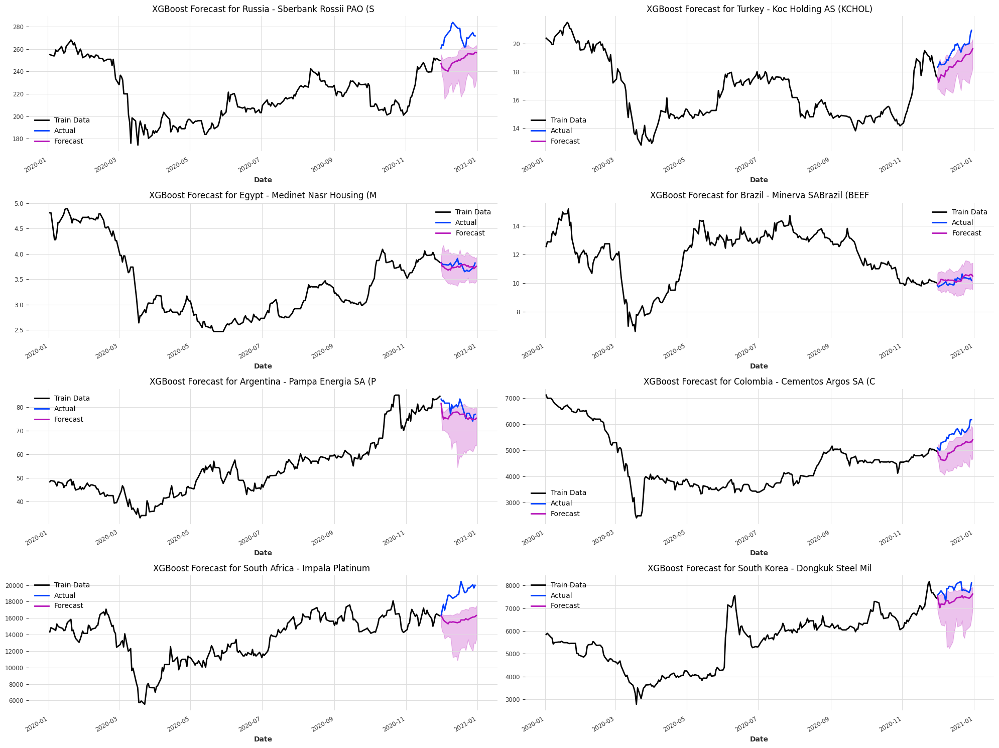

In [ ]:
exchange_rates_df= pd.read_csv('/content/gdrive/My Drive/usd_to_cur_2020.csv', index_col='Date', parse_dates=True)
forecast_results_xgb, performance_metrics_xgb, model_block_xgb = ts_forecast_darts_XGB(sheet_dict, target_col='Price', past_covariates_df = exchange_rates_df, val_month='December', val_year=2020)

In [ ]:
performance_metrics_xgb

,MAE,RMSE,MAPE,SMAPE,MASE,R2 Score
Russia - Sberbank Rossii PAO (S,22.841133,24.456127,8.332567,8.74762,6.947873,-12.556101
Turkey - Koc Holding AS (KCHOL),0.960856,0.998988,4.929736,5.063548,3.226451,-0.910984
Egypt - Medinet Nasr Housing (M,0.075505,0.085983,2.005166,2.011673,1.294838,-0.569059
Brazil - Minerva SABrazil (BEEF,0.229422,0.251091,2.277346,2.25516,0.789848,-0.035728
Argentina - Pampa Energia SA (P,3.295977,4.00163,4.070231,4.193939,2.302908,-1.089264
Colombia - Cementos Argos SA (C,567.503598,600.120138,10.044409,10.637693,6.032398,-2.704933
South Africa - Impala Platinum,3071.987233,3252.19262,16.046981,17.61328,6.359167,-8.910401
South Korea - Dongkuk Steel Mil,446.771348,489.626986,5.666525,5.865275,3.321355,-4.978542


### **3.3 Using the DARTS toolbox to implement the NBEATS models. The NBEATS model in DARTS can learn from multiple series**

In [ ]:
# Nbeats model

from darts.metrics import mae, rmse, mape, smape, mase, r2_score
from darts.dataprocessing.transformers import Scaler
from darts.models import NBEATSModel
from darts import TimeSeries
import pandas as pd
import matplotlib.pyplot as plt
import logging
from darts import concatenate
from darts.utils.likelihood_models import GaussianLikelihood, LaplaceLikelihood

logging.getLogger("pytorch_lightning.utilities.rank_zero").setLevel(logging.WARNING)
logging.getLogger("pytorch_lightning.accelerators.cuda").setLevel(logging.WARNING)

def ts_forecast_darts_NBEATS(sheet_dict, target_col='Price', past_covariates_df = exchange_rates_df, val_month='December', val_year=2020):

  # Determine the business days in the validation data
  val_start_date = pd.Timestamp(f'{val_year}-{val_month}-01')
  val_end_date = pd.Timestamp(f'{val_year}-{val_month}-01')+ pd.DateOffset(months=1) - pd.DateOffset(days=1)
  val_index = pd.date_range(start=val_start_date, end=val_end_date, freq='B')
  val_steps = len(val_index)

  # Check if past_covariates
  if past_covariates_df is not None:
      past_covariates_df.sort_index(ascending=True, inplace=True)

  # Initialize empty lists for series
  target_series = []
  exog_series= []
  train_series= []
  train_exog= []
  val_series= []
  val_exog= []


 # Initalize results
  forecast_results = {}
  models = {}
  performance_metrics = pd.DataFrame(index=sheet_dict.keys(), columns=['MAE', 'RMSE', 'MAPE', 'SMAPE', 'MASE', 'R2 Score'])
  for company, df_comp in sheet_dict.items():
      # Sort the DataFrame
      df_comp.sort_index(ascending=True, inplace=True)

      # Append target and exogenous DataFrame
      tseries= TimeSeries.from_series(df_comp[[target_col]])
      train_series_comp, val_series_comp =  tseries.split_before(val_start_date)
      val_series_comp = val_series_comp.drop_after(val_end_date)
      target_series.append(tseries)
      train_series.append(train_series_comp)
      val_series.append(val_series_comp)

      exog_cols = [col for col in df_comp.columns if col != target_col]
      if exog_cols:
          if past_covariates_df is None:
              eseries = TimeSeries.from_dataframe(df_comp[exog_cols])
          else:
              past_covariates= TimeSeries.from_dataframe(past_covariates_df.copy().reindex(df_comp.index).dropna())
              eseries = concatenate([past_covariates, TimeSeries.from_dataframe(df_comp[exog_cols])], axis=1)
      else:
          if past_covariates_df is not None:
              past_covariates = TimeSeries.from_dataframe(past_covariates_df.copy().reindex(df_comp.index).dropna())
              eseries= past_covariates

      exog_series.append(eseries)
      train_exog_comp, val_exog_comp = eseries.split_before(val_start_date)
      val_exog_comp  = val_exog_comp.drop_after(val_end_date)
      train_exog.append(train_exog_comp)
      val_exog.append(val_exog_comp)


  # Scale the data
  scaler_target = Scaler()
  scaler_exog = Scaler()
  train_series_scaled = scaler_target.fit_transform(train_series)
  train_exog_scaled = scaler_exog.fit_transform(train_exog)
  val_series_scaled = scaler_target.transform(val_series)
  val_exog_scaled = scaler_exog.transform(val_exog)
  exog_series = scaler_exog.transform(exog_series)

  # Define and train the NBEATS model
  model = NBEATSModel(input_chunk_length=100,
                    output_chunk_length=1, random_state=0,
                      likelihood=LaplaceLikelihood(prior_b=0.1))

  model.fit(train_series_scaled,
          past_covariates=train_exog_scaled,
      epochs=100, verbose=True)

  pred_series_scaled = model.predict(n=val_steps,  num_samples=100,
                              series= train_series_scaled,
                              past_covariates= exog_series)

  # Model
  models['model'] = model
  models['scale_target'] = scaler_target
  models['scale_exog'] =  scaler_exog

  # Unscaled forecast
  pred_series = scaler_target.inverse_transform(pred_series_scaled)

  # Plotting and saving the forecast results
  plt.figure(figsize=(20, 15))
  for i, company in enumerate(sheet_dict.keys()):
    forecasts_df = pd.DataFrame(index=val_index, columns=['Forecast', 'Upper bound (75%ile)', 'Lower bound (25%ile)'])
    forecasts_df['Forecast'] = pred_series[i].median().pd_series()
    forecasts_df['Upper bound (75%ile)'] = pred_series[i].quantile(0.75).pd_series()
    forecasts_df['Lower bound (25%ile)'] = pred_series[i].quantile(0.25).pd_series()
    forecast_results[company] = forecasts_df
    plt.subplot((len(sheet_dict.keys()) + 1) // 2, 2, i + 1)
    train_series[i].plot(label="Train Data")
    val_series[i].plot(label="Actual")
    pred_series[i].plot(label="Forecast")
    plt.title(f'NBEATS Forecast for {company}')
    plt.legend()
  plt.tight_layout()
  plt.show()

  # Evaluate the performance of the model

  for i, company in enumerate(sheet_dict.keys()):
      performance_metrics.loc[company, 'MAE'] = mae(val_series[i], pred_series[i])
      performance_metrics.loc[company, 'RMSE'] = rmse(val_series[i], pred_series[i])
      performance_metrics.loc[company, 'MAPE'] = mape(val_series[i], pred_series[i])
      performance_metrics.loc[company, 'SMAPE'] = smape(val_series[i], pred_series[i])
      performance_metrics.loc[company, 'MASE'] = mase(val_series[i], pred_series[i], train_series[i])
      performance_metrics.loc[company, 'R2 Score'] = r2_score(val_series[i], pred_series[i])

  return forecast_results, performance_metrics, models


INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | eval 
1 | train_criterion | MSELoss          | 0      | eval 
2 | val_criterion   | MSELoss          | 0      | eval 
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | stacks          | ModuleList       | 17.1 M | train
-------------------------------------------------------------
17.0 M    Trainable params
9.7 K     Non-trainable params
17.1 M    Total params
68.205    Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

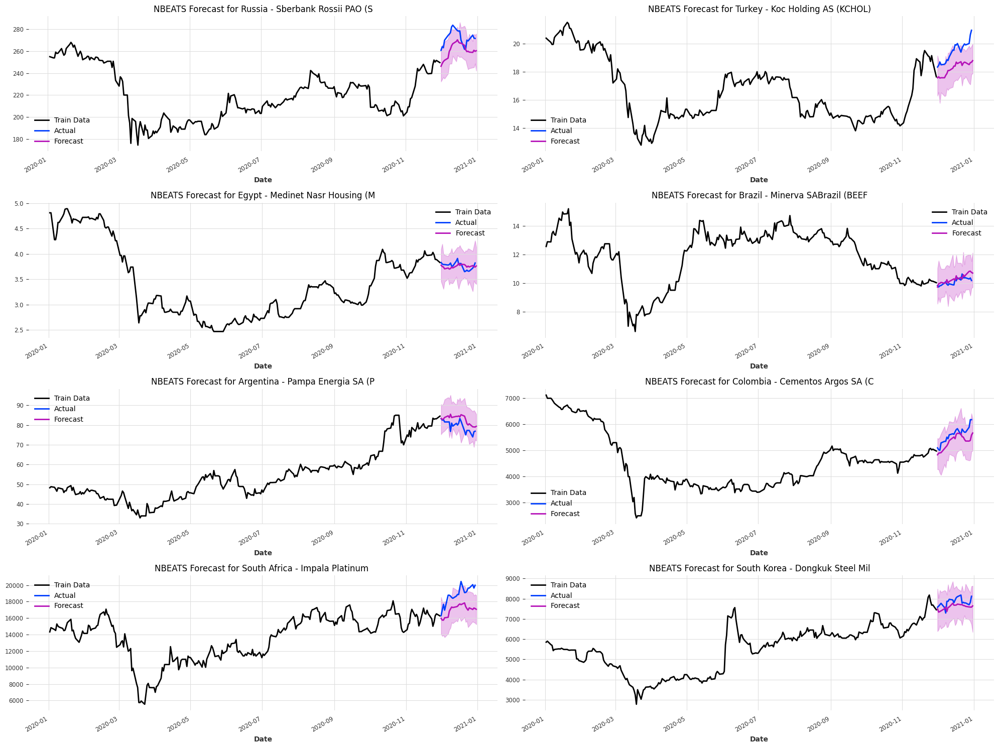

In [ ]:
exchange_rates_df= pd.read_csv('/content/gdrive/My Drive/usd_to_cur_2020.csv', index_col='Date', parse_dates=True)
forecast_results_nbeats, performance_metrics_nbeats, model_nbeats = ts_forecast_darts_NBEATS(sheet_dict, target_col='Price', past_covariates_df = exchange_rates_df, val_month='December', val_year=2020)

In [ ]:
performance_metrics_nbeats

,MAE,RMSE,MAPE,SMAPE,MASE,R2 Score
Russia - Sberbank Rossii PAO (S,12.014652,12.988082,4.399549,4.514794,3.654647,-2.823398
Turkey - Koc Holding AS (KCHOL),1.188437,1.248207,6.068999,6.275281,3.990644,-1.983392
Egypt - Medinet Nasr Housing (M,0.067477,0.076752,1.793354,1.796016,1.15717,-0.250233
Brazil - Minerva SABrazil (BEEF,0.24584,0.289599,2.428573,2.395304,0.84637,-0.377773
Argentina - Pampa Energia SA (P,3.389053,4.071214,4.33501,4.20195,2.367941,-1.162556
Colombia - Cementos Argos SA (C,276.30528,324.455078,4.85649,5.018303,2.937045,-0.082962
South Africa - Impala Platinum,1824.188575,1958.105842,9.547365,10.09368,3.776161,-2.592618
South Korea - Dongkuk Steel Mil,263.373468,298.623502,3.346614,3.4115,1.957952,-1.223886


### **3.4 Using the DARTS toolbox to implement the BLOCK-RNN model which can also use past covariates**

In [ ]:
from darts.metrics import mae, rmse, mape, smape, mase, r2_score
from darts.dataprocessing.transformers import Scaler
from darts.models.forecasting.block_rnn_model import BlockRNNModel
from darts import TimeSeries
import pandas as pd
import matplotlib.pyplot as plt
import logging
from darts import concatenate
from darts.utils.likelihood_models import GaussianLikelihood, LaplaceLikelihood

logging.getLogger("pytorch_lightning.utilities.rank_zero").setLevel(logging.WARNING)
logging.getLogger("pytorch_lightning.accelerators.cuda").setLevel(logging.WARNING)

def ts_forecast_darts_BLOCK_LSTM(sheet_dict, target_col='Price', past_covariates_df = exchange_rates_df, val_month='December', val_year=2020):

  # Determine the business days in the validation data
  val_start_date = pd.Timestamp(f'{val_year}-{val_month}-01')
  val_end_date = pd.Timestamp(f'{val_year}-{val_month}-01')+ pd.DateOffset(months=1) - pd.DateOffset(days=1)
  val_index = pd.date_range(start=val_start_date, end=val_end_date, freq='B')
  val_steps = len(val_index)

  # Check if past_covariates
  if past_covariates_df is not None:
      past_covariates_df.sort_index(ascending=True, inplace=True)

  # Initialize empty lists for series
  target_series = []
  exog_series= []
  train_series= []
  train_exog= []
  val_series= []
  val_exog= []


 # Initalize results
  forecast_results = {}
  models = {}
  performance_metrics = pd.DataFrame(index=sheet_dict.keys(), columns=['MAE', 'RMSE', 'MAPE', 'SMAPE', 'MASE', 'R2 Score'])
  for company, df_comp in sheet_dict.items():
      # Sort the DataFrame
      df_comp.sort_index(ascending=True, inplace=True)

      # Append target and exogenous DataFrame
      tseries= TimeSeries.from_series(df_comp[[target_col]])
      train_series_comp, val_series_comp =  tseries.split_before(val_start_date)
      val_series_comp = val_series_comp.drop_after(val_end_date)
      target_series.append(tseries)
      train_series.append(train_series_comp)
      val_series.append(val_series_comp)

      exog_cols = [col for col in df_comp.columns if col != target_col]
      if exog_cols:
          if past_covariates_df is None:
              eseries = TimeSeries.from_dataframe(df_comp[exog_cols])
          else:
              past_covariates= TimeSeries.from_dataframe(past_covariates_df.copy().reindex(df_comp.index).dropna())
              eseries = concatenate([past_covariates, TimeSeries.from_dataframe(df_comp[exog_cols])], axis=1)
      else:
          if past_covariates_df is not None:
              past_covariates = TimeSeries.from_dataframe(past_covariates_df.copy().reindex(df_comp.index).dropna())
              eseries= past_covariates

      exog_series.append(eseries)
      train_exog_comp, val_exog_comp = eseries.split_before(val_start_date)
      val_exog_comp  = val_exog_comp.drop_after(val_end_date)
      train_exog.append(train_exog_comp)
      val_exog.append(val_exog_comp)


  # Scale the data
  scaler_target = Scaler()
  scaler_exog = Scaler()
  train_series_scaled = scaler_target.fit_transform(train_series)
  train_exog_scaled = scaler_exog.fit_transform(train_exog)
  val_series_scaled = scaler_target.transform(val_series)
  val_exog_scaled = scaler_exog.transform(val_exog)
  exog_series_scaled = scaler_exog.transform(exog_series)

  # Define and train the Block RNN model
  model = BlockRNNModel(input_chunk_length=100,
                    output_chunk_length=1, random_state=0, model='LSTM',
                      likelihood=LaplaceLikelihood(prior_b=0.1))
  model.fit(train_series_scaled,
          past_covariates=train_exog_scaled,
      epochs=100, verbose=True)

  pred_series_scaled = model.predict(n=val_steps,  num_samples=100,
                              series= train_series_scaled,
                              past_covariates= exog_series_scaled)

  # Model
  models['model'] = model
  models['scale_target'] = scaler_target
  models['scale_exog'] =  scaler_exog

  # Unscaled forecast
  pred_series = scaler_target.inverse_transform(pred_series_scaled)

  # Plotting and saving the forecast results
  plt.figure(figsize=(20, 15))
  for i, company in enumerate(sheet_dict.keys()):
    forecasts_df = pd.DataFrame(index=val_index, columns=['Forecast', 'Upper bound (75%ile)', 'Lower bound (25%ile)'])
    forecasts_df['Forecast'] = pred_series[i].median().pd_series()
    forecasts_df['Upper bound (75%ile)'] = pred_series[i].quantile(0.75).pd_series()
    forecasts_df['Lower bound (25%ile)'] = pred_series[i].quantile(0.25).pd_series()
    forecast_results[company] = forecasts_df
    plt.subplot((len(sheet_dict.keys()) + 1) // 2, 2, i + 1)
    train_series[i].plot(label="Train Data")
    val_series[i].plot(label="Actual")
    pred_series[i].plot(label="Forecast")
    plt.title(f'BLOCK_LSTM Forecast for {company}')
    plt.legend()
  plt.tight_layout()
  plt.show()

  # Evaluate the performance of the model

  for i, company in enumerate(sheet_dict.keys()):
      performance_metrics.loc[company, 'MAE'] = mae(val_series[i], pred_series[i])
      performance_metrics.loc[company, 'RMSE'] = rmse(val_series[i], pred_series[i])
      performance_metrics.loc[company, 'MAPE'] = mape(val_series[i], pred_series[i])
      performance_metrics.loc[company, 'SMAPE'] = smape(val_series[i], pred_series[i])
      performance_metrics.loc[company, 'MASE'] = mase(val_series[i], pred_series[i], train_series[i])
      performance_metrics.loc[company, 'R2 Score'] = r2_score(val_series[i], pred_series[i])

  return forecast_results, performance_metrics, models



INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | eval 
1 | train_criterion | MSELoss          | 0      | eval 
2 | val_criterion   | MSELoss          | 0      | eval 
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 4.1 K  | train
6 | fc              | Sequential       | 52     | train
-------------------------------------------------------------
4.2 K     Trainable params
0         Non-trainable params
4.2 K     Total params
0.017     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

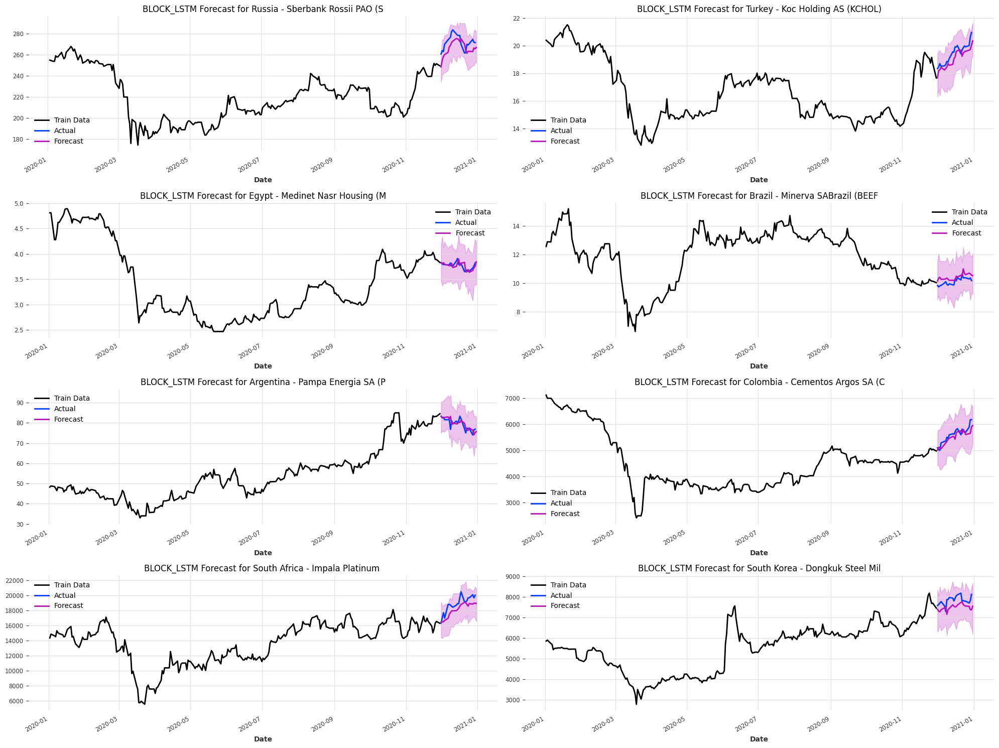

In [ ]:
exchange_rates_df= pd.read_csv('/content/gdrive/My Drive/usd_to_cur_2020.csv', index_col='Date', parse_dates=True)
forecast_results_block_lstm, performance_metrics_block_lstm, model_block_lstm = ts_forecast_darts_BLOCK_LSTM(sheet_dict, target_col='Price', past_covariates_df = exchange_rates_df, val_month='December', val_year=2020)

In [ ]:
performance_metrics_block_lstm

,MAE,RMSE,MAPE,SMAPE,MASE,R2 Score
Russia - Sberbank Rossii PAO (S,7.4415,7.96238,2.735204,2.771913,2.263574,-0.436962
Turkey - Koc Holding AS (KCHOL),0.449825,0.506451,2.297605,2.330193,1.510463,0.508852
Egypt - Medinet Nasr Housing (M,0.044849,0.06163,1.191111,1.188003,0.769116,0.193878
Brazil - Minerva SABrazil (BEEF,0.335303,0.366915,3.336538,3.272202,1.154371,-1.211641
Argentina - Pampa Energia SA (P,1.459672,2.034917,1.865078,1.851077,1.019877,0.459727
Colombia - Cementos Argos SA (C,147.995483,183.538271,2.59625,2.639568,1.573149,0.653457
South Africa - Impala Platinum,815.987008,944.777482,4.281864,4.406949,1.689134,0.163631
South Korea - Dongkuk Steel Mil,358.544965,403.093674,4.549231,4.679083,2.665469,-3.052066


### **3.5 Using the DARTS toolbox to implement the Transformer model which can also use past covariates**

In [ ]:
from darts.metrics import mae, rmse, mape, smape, mase, r2_score
from darts.dataprocessing.transformers import Scaler
from darts.models.forecasting.transformer_model import TransformerModel
from darts import TimeSeries
import pandas as pd
import matplotlib.pyplot as plt
import logging
from darts import concatenate
from darts.utils.likelihood_models import GaussianLikelihood, LaplaceLikelihood

logging.getLogger("pytorch_lightning.utilities.rank_zero").setLevel(logging.WARNING)
logging.getLogger("pytorch_lightning.accelerators.cuda").setLevel(logging.WARNING)

def ts_forecast_darts_Transformer(sheet_dict, target_col='Price', past_covariates_df = exchange_rates_df, val_month='December', val_year=2020):

  # Determine the business days in the validation data
  val_start_date = pd.Timestamp(f'{val_year}-{val_month}-01')
  val_end_date = pd.Timestamp(f'{val_year}-{val_month}-01')+ pd.DateOffset(months=1) - pd.DateOffset(days=1)
  val_index = pd.date_range(start=val_start_date, end=val_end_date, freq='B')
  val_steps = len(val_index)

  # Check if past_covariates
  if past_covariates_df is not None:
      past_covariates_df.sort_index(ascending=True, inplace=True)


  # Initialize empty lists for series
  target_series = []
  exog_series= []
  train_series= []
  train_exog= []
  val_series= []
  val_exog= []


 # Initalize results
  forecast_results = {}
  models = {}
  performance_metrics = pd.DataFrame(index=sheet_dict.keys(), columns=['MAE', 'RMSE', 'MAPE', 'SMAPE', 'MASE', 'R2 Score'])
  for company, df_comp in sheet_dict.items():
      # Sort the DataFrame
      df_comp.sort_index(ascending=True, inplace=True)

      # Append target and exogenous DataFrame
      tseries= TimeSeries.from_series(df_comp[[target_col]])
      train_series_comp, val_series_comp =  tseries.split_before(val_start_date)
      val_series_comp = val_series_comp.drop_after(val_end_date)
      target_series.append(tseries)
      train_series.append(train_series_comp)
      val_series.append(val_series_comp)

      exog_cols = [col for col in df_comp.columns if col != target_col]
      if exog_cols:
          if past_covariates_df is None:
              eseries = TimeSeries.from_dataframe(df_comp[exog_cols])
          else:
              past_covariates= TimeSeries.from_dataframe(past_covariates_df.copy().reindex(df_comp.index).dropna())
              eseries = concatenate([past_covariates, TimeSeries.from_dataframe(df_comp[exog_cols])], axis=1)
      else:
          if past_covariates_df is not None:
              past_covariates = TimeSeries.from_dataframe(past_covariates_df.copy().reindex(df_comp.index).dropna())
              eseries= past_covariates

      exog_series.append(eseries)
      train_exog_comp, val_exog_comp = eseries.split_before(val_start_date)
      val_exog_comp  = val_exog_comp.drop_after(val_end_date)
      train_exog.append(train_exog_comp)
      val_exog.append(val_exog_comp)


  # Scale the data
  scaler_target = Scaler()
  scaler_exog = Scaler()
  train_series_scaled = scaler_target.fit_transform(train_series)
  train_exog_scaled = scaler_exog.fit_transform(train_exog)
  val_series_scaled = scaler_target.transform(val_series)
  val_exog_scaled = scaler_exog.transform(val_exog)
  exog_series_scaled = scaler_exog.transform(exog_series)

  # Define and train the Transformer model
  model = TransformerModel(input_chunk_length=100,
                    output_chunk_length=1, random_state=0,
                      likelihood=LaplaceLikelihood(prior_b=0.1))

  model.fit(train_series_scaled,
          past_covariates=train_exog_scaled,epochs=100, verbose=True)

  pred_series_scaled = model.predict(n=val_steps,  num_samples=100,
                              series= train_series_scaled,
                              past_covariates= exog_series_scaled)

  # Model
  models['model'] = model
  models['scale_target'] = scaler_target
  models['scale_exog'] =  scaler_exog

  # Unscaled forecast
  pred_series = scaler_target.inverse_transform(pred_series_scaled)

  # Plotting and saving the forecast results
  plt.figure(figsize=(20, 15))
  for i, company in enumerate(sheet_dict.keys()):
    forecasts_df = pd.DataFrame(index=val_index, columns=['Forecast', 'Upper bound (75%ile)', 'Lower bound (25%ile)'])
    forecasts_df['Forecast'] = pred_series[i].median().pd_series()
    forecasts_df['Upper bound (75%ile)'] = pred_series[i].quantile(0.75).pd_series()
    forecasts_df['Lower bound (25%ile)'] = pred_series[i].quantile(0.25).pd_series()
    forecast_results[company] = forecasts_df
    plt.subplot((len(sheet_dict.keys()) + 1) // 2, 2, i + 1)
    train_series[i].plot(label="Train Data")
    val_series[i].plot(label="Actual")
    pred_series[i].plot(label="Forecast")
    plt.title(f'Transformer Forecast for {company}')
    plt.legend()
  plt.tight_layout()
  plt.show()

  # Evaluate the performance of the model

  for i, company in enumerate(sheet_dict.keys()):
      performance_metrics.loc[company, 'MAE'] = mae(val_series[i], pred_series[i])
      performance_metrics.loc[company, 'RMSE'] = rmse(val_series[i], pred_series[i])
      performance_metrics.loc[company, 'MAPE'] = mape(val_series[i], pred_series[i])
      performance_metrics.loc[company, 'SMAPE'] = smape(val_series[i], pred_series[i])
      performance_metrics.loc[company, 'MASE'] = mase(val_series[i], pred_series[i], train_series[i])
      performance_metrics.loc[company, 'R2 Score'] = r2_score(val_series[i], pred_series[i])

  return forecast_results, performance_metrics, models

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:306: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
INFO:pytorch_lightning.callbacks.model_summary:
  | Name                | Type                | Params | Mode 
--------------------------------------------------------------------
0 | criterion           | MSELoss             | 0      | eval 
1 | train_criterion     | MSELoss             | 0      | eval 
2 | val_criterion       | MSELoss             | 0      | eval 
3 | train_metrics       | MetricCollection    | 0      | train
4 | val_metrics         | MetricCollection    | 0      | train
5 | encoder             | Linear              | 960    | train
6 | positional_encoding | _PositionalEncoding | 0      |

Training: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

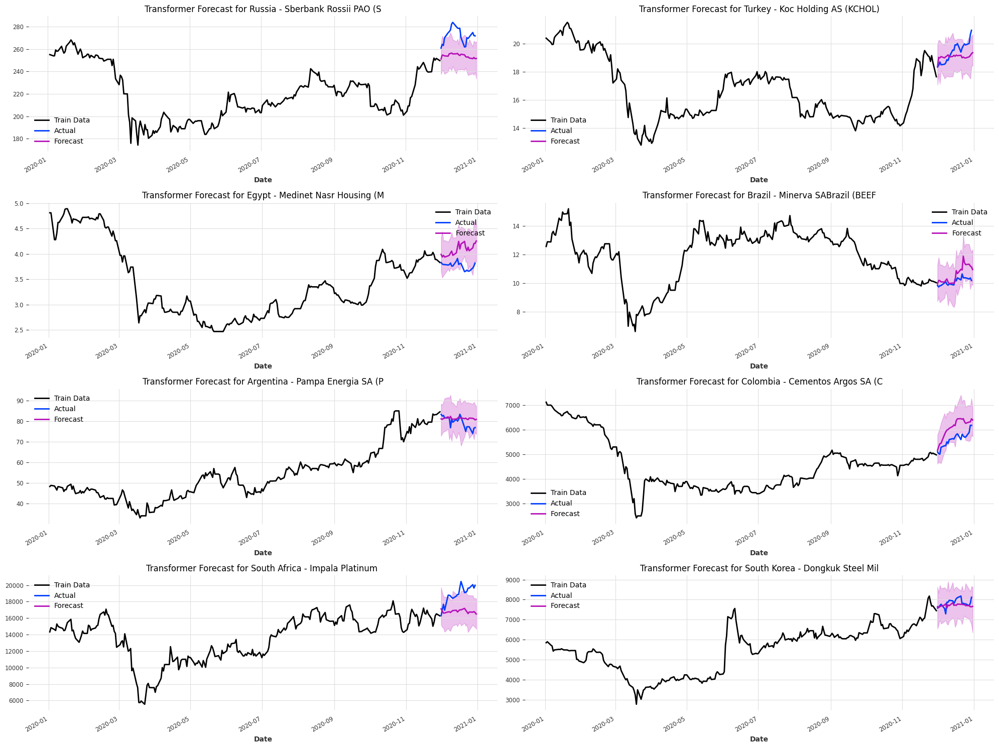

In [ ]:
exchange_rates_df= pd.read_csv('/content/gdrive/My Drive/usd_to_cur_2020.csv', index_col='Date', parse_dates=True)
forecast_results_transformer, performance_metrics_transformer, model_transformer = ts_forecast_darts_Transformer(sheet_dict, target_col='Price', past_covariates_df = exchange_rates_df, val_month='December', val_year=2020)

In [ ]:
performance_metrics_transformer

,MAE,RMSE,MAPE,SMAPE,MASE,R2 Score
Russia - Sberbank Rossii PAO (S,18.210579,19.179414,6.641124,6.89289,5.53934,-7.33739
Turkey - Koc Holding AS (KCHOL),0.632756,0.751715,3.201625,3.255681,2.124728,-0.08204
Egypt - Medinet Nasr Housing (M,0.307519,0.334739,8.206897,7.825104,5.273668,-22.780909
Brazil - Minerva SABrazil (BEEF,0.487137,0.635444,4.768948,4.587847,1.677098,-5.633414
Argentina - Pampa Energia SA (P,2.544744,3.312185,3.287439,3.205027,1.77802,-0.431359
Colombia - Cementos Argos SA (C,468.89148,504.462343,8.364734,7.981129,4.98418,-1.617951
South Africa - Impala Platinum,2075.46429,2262.797347,10.797053,11.511772,4.296314,-3.797666
South Korea - Dongkuk Steel Mil,177.732221,232.31474,2.260664,2.280961,1.321284,-0.345916


## **4. Using next day forecasts to make "BUY", "SELL" or "HOLD" decisions. We will be using bollinger bands to make that decision**

In [ ]:
def calculate_bollinger_bands(series, window=10, num_std=2):
  # forecasted prices series
    rolling_mean = series.rolling(window=window).mean()
    rolling_std = series.rolling(window=window).std()
    upper_band = rolling_mean + (rolling_std * num_std)
    lower_band = rolling_mean - (rolling_std * num_std)
    return pd.DataFrame({'UpperBand': upper_band, 'LowerBand': lower_band})



def hold_stocks_and_balance(df_combined, stoploss, min_margin, max_hold, LB_threshold, initial_balance=1000):
    running_capital = initial_balance #Initial balance to keep track of the available capital.
    stocks = 0 # no of stocks
    stop_loss_price = 0 # Price to trigger a stop loss, i.e a sell signal
    locked_price = 0 # Price at which the stock was purchased
    hold_counter = 0 # No of days a stock is held
    signals_df = pd.DataFrame(index=df_combined.index, columns=['Buy', 'Sell', 'Hold'])
    prev = [] # store previous stock prices
    lower_band = [] # store lower band prices
    buy_sell = [] # store buy sell decisions
    portfolio = [] # track the portfolio value

    for i in range(len(df_combined)):
        current_price = df_combined.iloc[i]['Actual']
        index = df_combined.index[i]
        upper_band = df_combined.iloc[i]['UpperBand']
        lower_band.append(df_combined.iloc[i]['LowerBand'])
        prev.append(current_price)

        condition_above = current_price <= (1 + LB_threshold) * lower_band[-1]

        if len(prev) > 1:
            if stocks == 0 and running_capital != 0:
              # Buy decision
                if (prev[-2] < lower_band[-2]) and (condition_above):
                    stocks = running_capital / current_price
                    signals_df.at[index, 'Buy'] = current_price
                    running_capital = 0 # Buy all stocks
                    stop_loss_price = current_price
                    locked_price = current_price
                    buy_sell.append(('Buy', index, current_price))
            elif stocks > 0:
                if current_price > stop_loss_price:
                    stop_loss_price = current_price
                    # Stoploss Sell condition
                if current_price < (1 - stoploss) * stop_loss_price:
                    running_capital += stocks * current_price # sell the stocks at current prices
                    stocks = 0
                    stop_loss_price = 0
                    signals_df.at[index, 'Sell'] = current_price
                    buy_sell.append(('Sell', index, current_price))

                    # Sell if the price is avoce a certain margin and either if it the current price exceeds the upper prediction band or the hold days are exceed the max hold
                elif (current_price > upper_band and current_price > ((1 + min_margin) * locked_price)) or (hold_counter >= max_hold and current_price > ((1 + min_margin) * locked_price)):
                    running_capital += stocks * current_price
                    stocks = 0
                    stop_loss_price = 0
                    signals_df.at[index, 'Sell'] = current_price
                    buy_sell.append(('Sell', index, current_price))
                else:
                    # Hold decision
                    signals_df.at[index, 'Hold'] = current_price
                    hold_counter += 1

        portfolio.append(running_capital + stocks * current_price)

    portfolio_df = pd.DataFrame(portfolio, index=df_combined.index, columns=['Portfolio Value'])
    return signals_df, running_capital, stocks, buy_sell, portfolio_df

In [ ]:
def optimize_params_strategy(forecast_df, df_actual, window_range=range(10, 30, 5), LB_threshold_range = np.arange(0.01, 0.05, 0.01),
            stoploss_range=np.arange(0.05, 0.1, 0.01), min_margin_range=np.arange(0.05, 0.1, 0.01), max_hold_range=range(0,20,5)):

  best_window = None
  best_LB_threshold = None
  best_stoploss = None
  best_min_margin = None
  best_max_hold = None
  best_balance = float('-inf')

  for window in window_range:
      for LB_threshold in LB_threshold_range:
        for stoploss in stoploss_range:
          for min_margin in min_margin_range:
            for max_hold in max_hold_range:
              bollinger_bands = calculate_bollinger_bands(forecast_df, window=window)
              df_combined = pd.merge(forecast_df, bollinger_bands, left_index=True, right_index=True, how='inner')
              df_combined['Actual'] = df_actual
              signals_df, final_balance, stocks, buy_sell, portfolio_df = hold_stocks_and_balance(df_combined, stoploss,
                                                        min_margin, max_hold, LB_threshold)
              final_balance = final_balance + stocks * df_combined['Actual'].iloc[-1]
              if final_balance > best_balance:
                best_balance = final_balance
                best_window = window
                best_LB_threshold = LB_threshold
                best_stoploss = stoploss
                best_min_margin = min_margin
                best_max_hold = max_hold

  return best_window, best_LB_threshold, best_stoploss, best_min_margin, best_max_hold

### **4.1 Using BLOCK LSTM model which was one of the best performing model using the DARTS toolbox to make investment decisions**:

In [ ]:
from darts.metrics import mae, rmse, mape, smape, mase, r2_score
from darts.dataprocessing.transformers import Scaler
from darts.models.forecasting.block_rnn_model import BlockRNNModel
from darts import TimeSeries
import pandas as pd
import matplotlib.pyplot as plt
from darts import concatenate
import warnings
import logging
logging.getLogger("pytorch_lightning").setLevel(logging.ERROR)
warnings.filterwarnings('ignore')

def prediction_strategy_lstm_model(sheet_dict, target_col='Price', past_covariates_df=None,
                                     val_start='2020-11-01', test_start='2021-01-01', test_end='2021-03-31', lags=3, initial_balance=1000 ):

  # Determine the business days in the validation data
  test_start_date = pd.Timestamp(test_start)
  test_end_date = pd.Timestamp(test_end)
  test_index = pd.date_range(start=test_start, end=test_end, freq='B')
  test_steps = len(test_index)
  val_start_date = pd.Timestamp(val_start)
  val_end_date = pd.Timestamp(test_start_date)- pd.DateOffset(days=1)
  val_index = pd.date_range(start=val_start_date, end=val_end_date, freq='B')
  val_steps = len(val_index)

  # Check if past_covariates
  if past_covariates_df is not None:
      past_covariates_df.sort_index(ascending=True, inplace=True)

  # Initialize empty lists for series
  target_series_all = []
  exog_series_all= []
  train_series_all= []
  test_series_all= []
  train_exog_all= []
  test_exog_all= []
  forecast_df = pd.DataFrame(index= test_index)


  for company, df_comp in sheet_dict.items():
      # Sort the DataFrame
      df_comp.sort_index(ascending=True, inplace=True)

      # Append target and exogenous DataFrame
      target_series= TimeSeries.from_series(df_comp[[target_col]])
      train_series, test_series = target_series.split_before(test_start_date)
      target_series_all.append(target_series)
      train_series_all.append(train_series)
      test_series_all.append(test_series)

      exog_cols = [col for col in df_comp.columns if col != target_col]
      if exog_cols:
          if past_covariates_df is None:
              exog_series = TimeSeries.from_dataframe(df_comp[exog_cols])
          else:
              past_covariates= TimeSeries.from_dataframe(past_covariates_df.copy().reindex(df_comp.index).dropna())
              exog_series = concatenate([past_covariates, TimeSeries.from_dataframe(df_comp[exog_cols])], axis=1)
      else:
          if past_covariates_df is not None:
              past_covariates = TimeSeries.from_dataframe(past_covariates_df.copy().reindex(df_comp.index).dropna())
              exog_series= past_covariates

      exog_series_all.append(exog_series)
      train_exog, test_exog = exog_series.split_before(test_start_date)
      train_exog_all.append(train_exog)
      test_exog_all.append(test_exog)



  # Scale the data
  scaler_target = Scaler()
  scaler_exog = Scaler()

  train_series_scaled = scaler_target.fit_transform(train_series_all)
  test_series_scaled = scaler_target.transform(test_series_all)
  train_exog_scaled = scaler_exog.fit_transform(train_exog_all)
  test_exog_scaled = scaler_exog.transform(test_exog_all)
  exog_series_scaled = scaler_exog.transform(exog_series_all)

  # Define and train the Transformer model
  model = BlockRNNModel(input_chunk_length=100,
                    output_chunk_length=1, random_state=0, model='LSTM')

  model.fit(train_series_scaled,
          past_covariates=train_exog_scaled,epochs=50, verbose=False)

  # Predict the next day

  pred_series_scaled = model.predict(n= test_steps, series= train_series_scaled,
                              past_covariates= exog_series_scaled)

  # Unscaled test forecasts
  pred_series = scaler_target.inverse_transform(pred_series_scaled)
  # Historical forecasts
  val_series_scaled = model.historical_forecasts(
      series=train_series_scaled,
      past_covariates=train_exog_scaled,
      start =val_start_date,
      last_points_only=True,
      verbose=False,
      forecast_horizon  =1,
      show_warnings=False
  )
  # Unscaled val series forecasts
  val_series = scaler_target.inverse_transform(val_series_scaled)
  # Initialize values for the dicts for all companies

  final_balance_all= {}
  buy_sell_all ={}
  portfolio_all= {}
  final_results= {}

  # Loop  through each company
  for i, (company, df) in enumerate(sheet_dict.items()):
    forecast_df[company] = pred_series[i].pd_series()

    best_window, best_LB_threshold, best_stoploss, best_min_margin, best_max_hold = optimize_params_strategy(val_series[i].pd_series(), df[target_col],
              window_range=range(5, 25, 5), LB_threshold_range = np.arange(0.01, 0.06, 0.02),
              stoploss_range=np.arange(0.01, 0.06, 0.02), min_margin_range=np.arange(0.01, 0.06, 0.02), max_hold_range=range(0,15,5))

    print(f"Best window: {best_window}")
    print(f"Best LB_threshold: {best_LB_threshold}")
    print(f"Best stoploss: {best_stoploss}")
    print(f"Best min_margin: {best_min_margin}")
    print(f"Best max_hold: {best_max_hold}")

    bollinger_bands = calculate_bollinger_bands(forecast_df[company], window=best_window)
    df_combined = pd.merge(forecast_df, bollinger_bands, left_index=True, right_index=True, how='inner')
    df_combined['Actual'] = df[target_col]

    signals_df, final_balance, stocks, buy_sell, portfolio_df = hold_stocks_and_balance(df_combined, best_stoploss,
                                              best_min_margin, best_max_hold, best_LB_threshold, initial_balance)

    final_results[company] = {
        'forecast_df': forecast_df[company],
        'signals_df': signals_df,
        'final_balance': final_balance + stocks * df_combined['Actual'].iloc[-1],
        'portfolio_df': portfolio_df,
        'buy_sell': buy_sell}

    final_balance_all[company] = final_balance + stocks * df_combined['Actual'].iloc[-1]
    buy_sell_all[company] = buy_sell
    portfolio_all[company] = portfolio_df

    # Plot the actual vs forecasted values with Bollinger Bands and buy/sell signals
    fig, axs = plt.subplots(1, 2, figsize=(20,4))
    axs[0].plot(df.index, df[target_col], label='Actual')
    axs[0].plot(forecast_df.index, forecast_df[company], label='Forecast', linestyle='--')
    axs[0].fill_between(bollinger_bands.index, bollinger_bands['UpperBand'], bollinger_bands['LowerBand'], color='grey', alpha=0.3, label='Bollinger Bands')
    axs[0].scatter([date for signal, date, price in buy_sell if signal == 'Buy'],
                  [price for signal, date, price in buy_sell if signal == 'Buy'],
                  marker='^', color='g', label='Buy Signal', alpha=1)

    axs[0].scatter([date for signal, date, price in buy_sell if signal == 'Sell'],
                  [price for signal, date, price in buy_sell if signal == 'Sell'],
                  marker='v', color='r', label='Sell Signal', alpha=1)
    axs[0].legend(loc='best')
    axs[0].set_title(f'Rolling Forecast vs Actual with Bollinger Bands for {company}')

    # Plot the portfolio value over time
    axs[1].plot(portfolio_df.index, portfolio_df['Portfolio Value'], label='Portfolio Value')
    axs[1].set_title('Portfolio Value Over Time')
    axs[1].set_xlabel('Date')
    axs[1].set_ylabel('Portfolio Value')
    axs[1].legend(loc='best')
    plt.show()

  return final_results, final_balance_all, buy_sell_all, portfolio_all


In [ ]:
from datetime import datetime

def fraction_of_year(start_date, end_date):
    """
    Calculate the fraction of the year between two dates.
    :param start_date: The start date (string in format 'YYYY-MM-DD').
    :param end_date: The end date (string in format 'YYYY-MM-DD').
    :return: Fraction of the year as a float.
    """
    start = datetime.strptime(start_date, '%Y-%m-%d')
    end = datetime.strptime(end_date, '%Y-%m-%d')
    days_in_year = 366 if start.year % 4 == 0 and (start.year % 100 != 0 or start.year % 400 == 0) else 365
    delta_days = (end - start).days
    fraction_year = delta_days / days_in_year
    return fraction_year

Predicting: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Best window: 5
Best LB_threshold: 0.01
Best stoploss: 0.01
Best min_margin: 0.049999999999999996
Best max_hold: 0


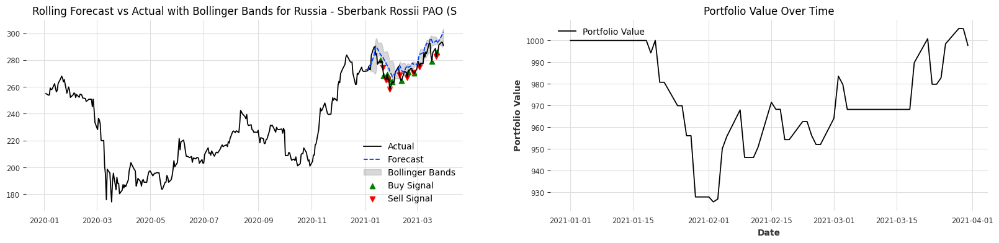

Best window: 5
Best LB_threshold: 0.03
Best stoploss: 0.03
Best min_margin: 0.03
Best max_hold: 10


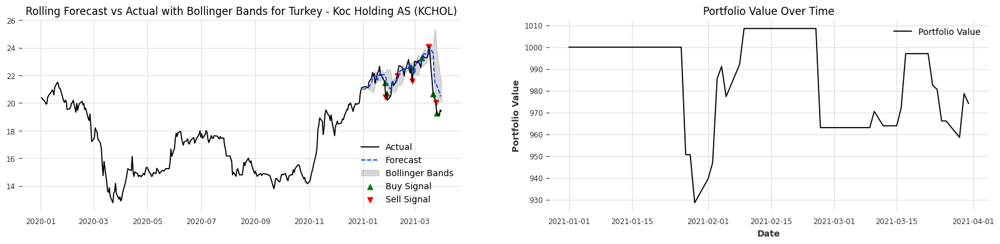

Best window: 15
Best LB_threshold: 0.01
Best stoploss: 0.03
Best min_margin: 0.03
Best max_hold: 0


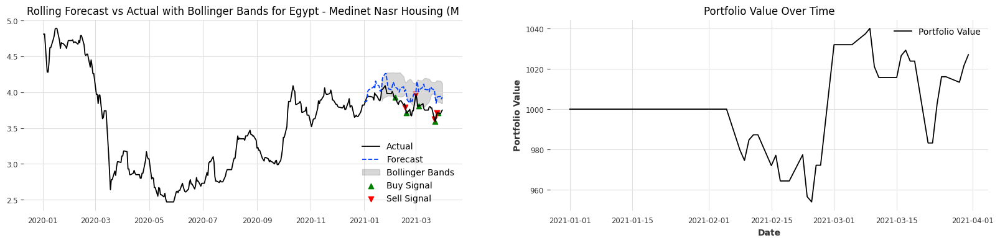

Best window: 10
Best LB_threshold: 0.01
Best stoploss: 0.01
Best min_margin: 0.03
Best max_hold: 0


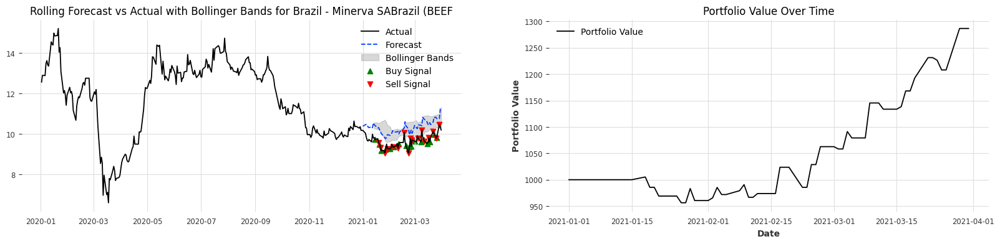

Best window: 10
Best LB_threshold: 0.01
Best stoploss: 0.049999999999999996
Best min_margin: 0.01
Best max_hold: 0


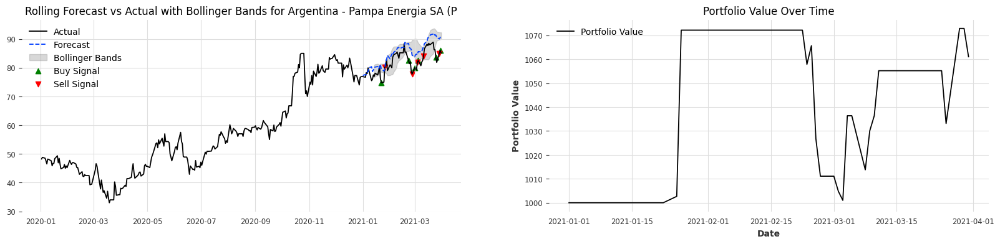

Best window: 5
Best LB_threshold: 0.01
Best stoploss: 0.01
Best min_margin: 0.01
Best max_hold: 5


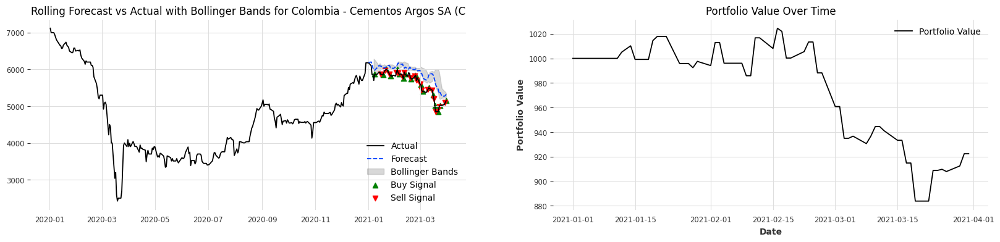

Best window: 5
Best LB_threshold: 0.01
Best stoploss: 0.01
Best min_margin: 0.049999999999999996
Best max_hold: 0


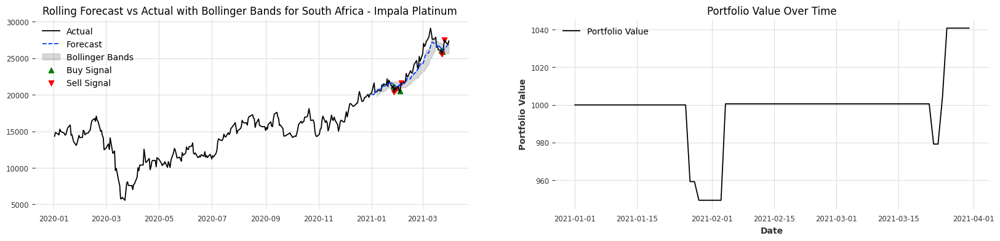

Best window: 5
Best LB_threshold: 0.03
Best stoploss: 0.03
Best min_margin: 0.01
Best max_hold: 5


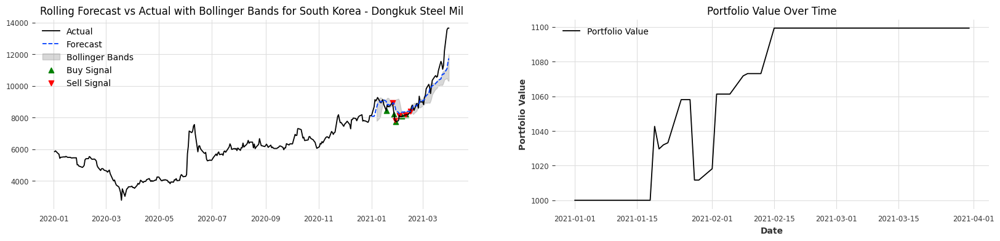

Total final balance: 8409.14945333486
Average final balance: 1051.1436816668574
ROI for the test_duration: 0.051143681666857344
Annualized ROI: 0.22698395732251142


In [ ]:
import warnings
import logging
logging.getLogger("pytorch_lightning").setLevel(logging.ERROR)
warnings.filterwarnings('ignore')

initial_balance= 1000 # initial balance for each company
test_start='2021-01-01'
test_end = '2021-03-31'
val_start = '2020-09-01'
exchange_rates_df= pd.read_csv('/content/gdrive/My Drive/usd_to_cur_2020.csv', index_col='Date', parse_dates=True)
results, final_balance_all, buy_sell_all, portfolio_all = prediction_strategy_lstm_model(sheet_dict, target_col='Price',
            past_covariates_df=exchange_rates_df, val_start='2020-11-01', test_start='2021-01-01', test_end='2021-03-31', lags=3, initial_balance = initial_balance)

total_final_balance = sum(final_balance_all.values())
print(f"Total final balance: {total_final_balance}")
total_initial_balance = initial_balance*len(sheet_dict)
print(f"Average final balance: {total_final_balance / len(sheet_dict)}")
print(f"ROI for the test_duration: {total_final_balance/ total_initial_balance - 1}")
fraction = fraction_of_year(test_start, test_end)
print(f"Annualized ROI: {((total_final_balance / total_initial_balance) **(1/fraction)) - 1}")

In [ ]:
total_final_balance = sum(final_balance_all.values())
print(f"Total final balance: {total_final_balance}")
total_initial_balance = initial_balance*len(sheet_dict)
print(f"Average final balance: {total_final_balance / len(sheet_dict)}")
print(f"ROI for the test_duration: {total_final_balance/ total_initial_balance - 1}")
fraction = fraction_of_year(test_start, test_end)
print(f"Annualized ROI: {((total_final_balance / total_initial_balance) **(1/fraction)) - 1}")

Total final balance: 8409.14945333486
Average final balance: 1051.1436816668574
ROI for the test_duration: 0.051143681666857344
Annualized ROI: 0.22698395732251142


### **4.2 Using ARIMAX model which was the best performing model across all implemented models to make investment decisions**

In [ ]:
import pandas as pd
import numpy as np
from pmdarima import auto_arima
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from datetime import datetime
from sklearn.model_selection import TimeSeriesSplit
import matplotlib.pyplot as plt
import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.simplefilter('ignore', ConvergenceWarning)


def create_lagged_features(data, target_col, lags=3):
    lagged_data = data.copy()
    for column in data.columns:
        if column != target_col:
            for lag in range(1, lags + 1):
                lagged_data[f'{column}_lag{lag}'] = data[column].shift(lag)
    lagged_data.dropna(inplace=True)
    return lagged_data

def prediction_strategy_arimax_model(sheet_dict, target_col='Price', past_covariates_df=None,
                                     val_start='2020-11-01', test_start='2021-01-01', test_end='2021-03-31', lags=3, initial_balance=1000 ):

  test_start_date = pd.Timestamp(test_start)
  test_end_date = pd.Timestamp(test_end)
  test_index = pd.date_range(start=test_start, end=test_end, freq='B')
  test_steps = len(test_index)
  val_start_date = pd.Timestamp(val_start)
  val_end_date = pd.Timestamp(test_start_date)- pd.DateOffset(days=1)
  val_index = pd.date_range(start=val_start_date, end=val_end_date, freq='B')
  val_steps = len(val_index)

  # Ensure past_covariates_df has a frequency
  if past_covariates_df is not None:
    past_covariates_df.sort_index(ascending=True, inplace=True)
    if past_covariates_df.index.freq is None:
        past_covariates_df.index.freq = pd.infer_freq(past_covariates_df.index)
    if past_covariates_df.index.freq is None:
        past_covariates_df.index.freq = 'B'


  # Initialize values for the dicts for all companies

  final_balance_all= {}
  buy_sell_all ={}
  portfolio_all= {}
  final_results= {}

 # Loop through each company

  for company, df in sheet_dict.items():
    # Sort the DataFrame
    df.sort_index(ascending=True, inplace=True)
    # Ensure the datetime index has a frequency
    if df.index.freq is None:
        df.index.freq = pd.infer_freq(df.index)
    if df.index.freq is None:
        df = df.asfreq('B')

    # Merge with past_covairates
    df_feat = df.merge(past_covariates_df, left_index=True, right_index=True, how='left')


    # Create lagged features for exogenous variables
    df_feat = create_lagged_features(df_feat, target_col, lags)

    # Split data into training and validation sets
    train_data = df_feat.loc[df_feat.index < val_start_date]
    val_data = df_feat.loc[(df_feat.index >= val_start_date) & (df_feat.index <= val_end_date)]
    test_data = df_feat.loc[(df_feat.index >= test_start_date) & (df_feat.index <= test_end_date)]
    train_data.sort_index(ascending=True, inplace=True)
    val_data.sort_index(ascending=True, inplace=True)
    test_data.sort_index(ascending=True, inplace=True)

    # Prepare lagged exogenous variables
    exog_cols = [col for col in train_data.columns if col != target_col]
    train_exog = train_data[exog_cols]
    test_exog = test_data[exog_cols]
    val_exog = val_data[exog_cols]

    # Optimize ARIMA parameters with lagged exogenous variables
    auto_arima_model = auto_arima(train_data[target_col],
                                  exogenous=train_exog,
                                  start_p=0, start_q=0,
                                  max_p=10, max_q=10,
                                  seasonal=False,
                                  trace=True,
                                  error_action='ignore',
                                  suppress_warnings=True,
                                  stepwise=False,
                                  verbose = False
                                  )


    # Initialize a DataFrame to store the forecasts
    val_forecast_df = pd.DataFrame(index=val_index, columns=['Forecast'])
    forecast_df = pd.DataFrame(index=test_index, columns=['Forecast'])

    # Perform rolling forecast to predict the validation data
    model = ARIMA(train_data[target_col], order=auto_arima_model.order, exog=train_exog)
    results = model.fit(method_kwargs={"maxiter": 5000, "disp": 0})
    forecast = results.forecast(steps=1, exog=val_exog.iloc[[0]])
    val_forecast_df.iloc[0] = forecast.values

    for i in range(1, len(val_index)):
        new_train_data = pd.concat([train_data, val_data.iloc[:i]])
        new_train_exog = pd.concat([train_exog, val_exog.iloc[:i]])
        model = ARIMA(new_train_data[target_col], order=auto_arima_model.order, exog=new_train_exog)
        results = model.fit(method_kwargs={"maxiter": 5000, "disp": 0})
        forecast = results.forecast(steps=1, exog=val_exog.iloc[[i]])
        val_forecast_df.iloc[i] = forecast.values

    # Perform rolling forecast to predict the test data
    model = ARIMA(pd.concat([train_data[target_col], val_data[target_col]]), order=auto_arima_model.order, exog=pd.concat([train_exog, val_exog]))
    results = model.fit(method_kwargs={"maxiter": 5000, "disp": 0})
    forecast = results.forecast(steps=1, exog=test_exog.iloc[[0]])
    forecast_df.iloc[0] = forecast.values

    for i in range(1, len(test_index)):
        new_train_data = pd.concat([train_data, val_data, test_data.iloc[:i]])
        new_train_exog = pd.concat([train_exog, val_exog, test_exog.iloc[:i]])
        model = ARIMA(new_train_data[target_col], order=auto_arima_model.order, exog=new_train_exog)
        results = model.fit(method_kwargs={"maxiter": 5000, "disp": 0})
        forecast = results.forecast(steps=1, exog=test_exog.iloc[[i]])
        forecast_df.iloc[i] = forecast.values


    best_window, best_LB_threshold, best_stoploss, best_min_margin, best_max_hold = optimize_params_strategy(val_forecast_df['Forecast'], df[target_col],
               window_range=range(5, 25, 5), LB_threshold_range = np.arange(0.01, 0.06, 0.02),
               stoploss_range=np.arange(0.01, 0.06, 0.02), min_margin_range=np.arange(0.01, 0.06, 0.02), max_hold_range=range(0,15,5))

    print(f"Best window: {best_window}")
    print(f"Best LB_threshold: {best_LB_threshold}")
    print(f"Best stoploss: {best_stoploss}")
    print(f"Best min_margin: {best_min_margin}")
    print(f"Best max_hold: {best_max_hold}")

    bollinger_bands = calculate_bollinger_bands(forecast_df['Forecast'], window=best_window)
    df_combined = pd.merge(forecast_df, bollinger_bands, left_index=True, right_index=True, how='inner')
    df_combined['Actual'] = df[target_col]

    signals_df, final_balance, stocks, buy_sell, portfolio_df = hold_stocks_and_balance(df_combined, best_stoploss,
                                                best_min_margin, best_max_hold, best_LB_threshold, initial_balance)

    final_results[company] = {
          'forecast_df': forecast_df,
          'signals_df': signals_df,
          'final_balance': final_balance,
          'portfolio_df': portfolio_df,
          'buy_sell': buy_sell
      }

    final_balance_all[company] = final_balance
    buy_sell_all[company] = buy_sell
    portfolio_all[company] = portfolio_df

    # Plot the actual vs forecasted values with Bollinger Bands and buy/sell signals
    fig, axs = plt.subplots(1, 2, figsize=(20,4))
    axs[0].plot(df.index, df[target_col], label='Actual')
    axs[0].plot(forecast_df.index, forecast_df["Forecast"], label='Forecast', linestyle='--')
    axs[0].fill_between(bollinger_bands.index, bollinger_bands['UpperBand'], bollinger_bands['LowerBand'], color='grey', alpha=0.3, label='Bollinger Bands')
    axs[0].scatter([date for signal, date, price in buy_sell if signal == 'Buy'],
                [price for signal, date, price in buy_sell if signal == 'Buy'],
                marker='^', color='g', label='Buy Signal', alpha=1)

    axs[0].scatter([date for signal, date, price in buy_sell if signal == 'Sell'],
                [price for signal, date, price in buy_sell if signal == 'Sell'],
                marker='v', color='r', label='Sell Signal', alpha=1)
    axs[0].legend(loc='best')
    axs[0].set_title(f'Rolling Forecast vs Actual with Bollinger Bands for {company}')

    # Plot the portfolio value over time
    axs[1].plot(portfolio_df.index, portfolio_df['Portfolio Value'], label='Portfolio Value')
    axs[1].set_title('Portfolio Value Over Time')
    axs[1].set_xlabel('Date')
    axs[1].set_ylabel('Portfolio Value')
    axs[1].legend(loc='best')
    plt.show()

  return final_results, final_balance_all, buy_sell_all, portfolio_all


 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1272.295, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1273.396, Time=0.04 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=1274.605, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=1276.455, Time=0.10 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=1263.317, Time=0.12 sec
 ARIMA(0,1,5)(0,0,0)[0] intercept   : AIC=1263.783, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1273.531, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1276.595, Time=0.10 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=1272.340, Time=0.12 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=1264.343, Time=0.16 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=1274.346, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=1277.531, Time=0.06 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=1265.604, Time=0.25 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=1264.948, Time=0.21 sec
 ARIMA(3,1,0)(0

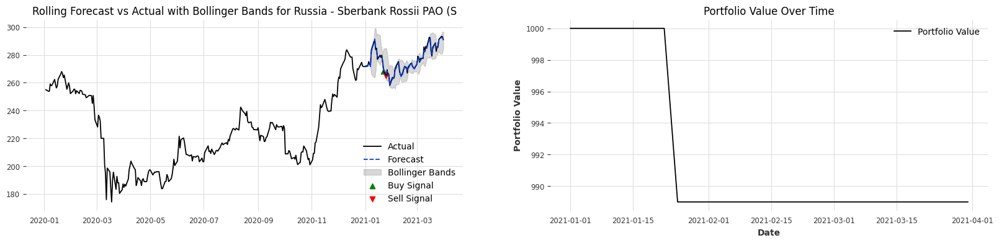

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=192.921, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=194.904, Time=0.04 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=196.287, Time=0.06 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=196.674, Time=0.07 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=191.508, Time=0.08 sec
 ARIMA(0,1,5)(0,0,0)[0] intercept   : AIC=193.491, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=194.906, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=196.864, Time=0.10 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=198.122, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=195.124, Time=0.15 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=193.479, Time=0.15 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=196.045, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=197.833, Time=0.10 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=193.367, Time=0.21 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=194.102, Time=0.35 sec
 ARIMA(3,1,0)(0,0,0)[0] i

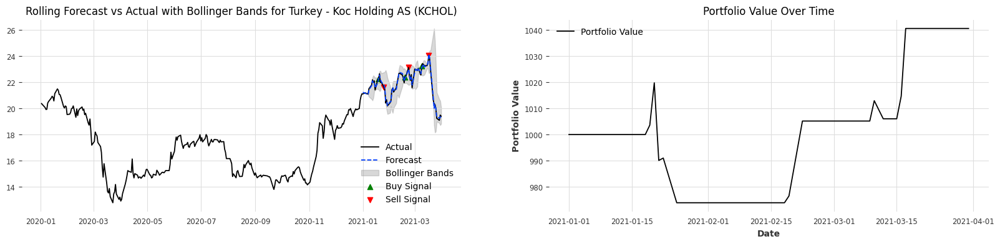

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-393.247, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-394.407, Time=0.05 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=-398.299, Time=0.11 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=-397.506, Time=0.13 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=-395.835, Time=0.17 sec
 ARIMA(0,1,5)(0,0,0)[0] intercept   : AIC=-397.449, Time=0.22 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-395.310, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-395.591, Time=0.10 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=-397.022, Time=0.13 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=-395.551, Time=0.21 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=-394.756, Time=0.35 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=-396.999, Time=0.08 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=-395.535, Time=0.13 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=-402.210, Time=0.26 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=-400.216, Time=0.30 sec
 ARIMA(3,1

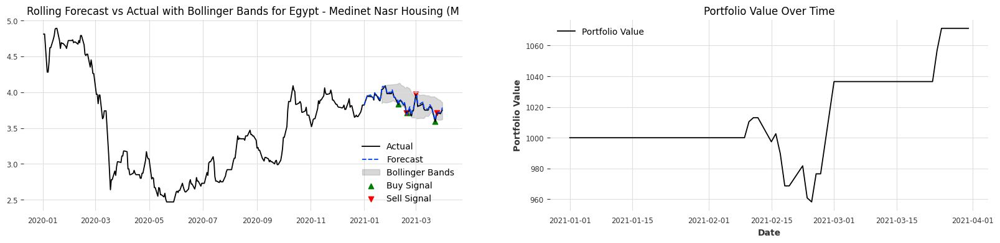

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=255.307, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=256.311, Time=0.05 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=253.256, Time=0.09 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=249.745, Time=0.07 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=250.930, Time=0.09 sec
 ARIMA(0,1,5)(0,0,0)[0] intercept   : AIC=252.190, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=256.065, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=258.738, Time=0.10 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=252.418, Time=0.09 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=251.329, Time=0.08 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=252.687, Time=0.15 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=255.419, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=254.550, Time=0.11 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=247.463, Time=0.21 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=249.176, Time=0.20 sec
 ARIMA(3,1,0)(0,0,0)[0] i

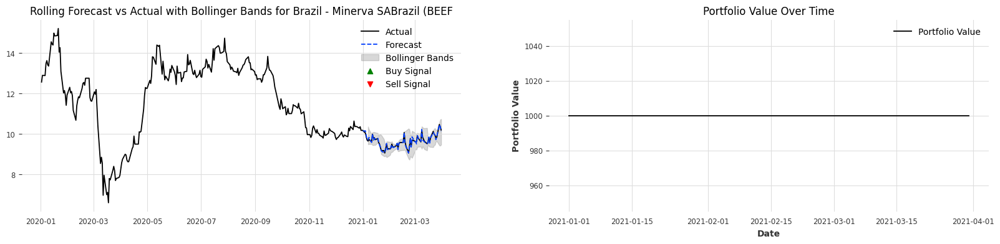

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=890.156, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=892.113, Time=0.03 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=894.071, Time=0.05 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=895.195, Time=0.05 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=897.174, Time=0.08 sec
 ARIMA(0,1,5)(0,0,0)[0] intercept   : AIC=898.004, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=892.111, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=894.023, Time=0.10 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=895.929, Time=0.13 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=897.187, Time=0.11 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=897.360, Time=0.17 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=894.062, Time=0.04 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=895.947, Time=0.10 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=890.520, Time=0.16 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=892.039, Time=0.21 sec
 ARIMA(3,1,0)(0,0,0)[0] i

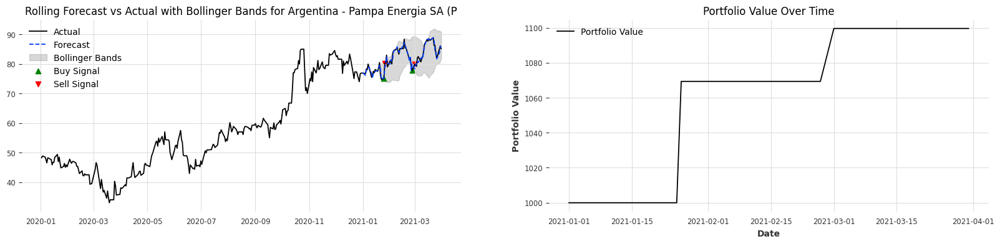

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2777.450, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2779.431, Time=0.06 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2774.870, Time=0.07 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=2775.961, Time=0.11 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=2777.642, Time=0.12 sec
 ARIMA(0,1,5)(0,0,0)[0] intercept   : AIC=2778.296, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2779.426, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2779.045, Time=0.11 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2775.531, Time=0.12 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=2776.609, Time=0.25 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=2778.559, Time=0.31 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2774.792, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2775.939, Time=0.10 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=2776.951, Time=0.25 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(3,1,0)(0

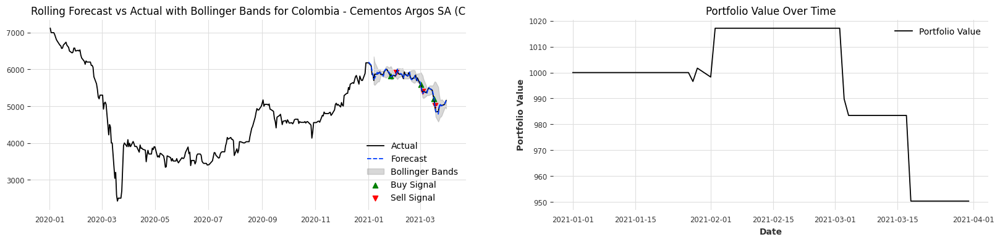

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3365.701, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3367.629, Time=0.03 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3368.424, Time=0.04 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=3366.945, Time=0.05 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=3368.917, Time=0.06 sec
 ARIMA(0,1,5)(0,0,0)[0] intercept   : AIC=3370.143, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3367.619, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3369.429, Time=0.07 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=3369.156, Time=0.07 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=3368.902, Time=0.12 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=3368.571, Time=0.04 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=3369.615, Time=0.08 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=3364.054, Time=0.11 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=3365.852, Time=0.24 sec
 ARIMA(3,1,0)(0

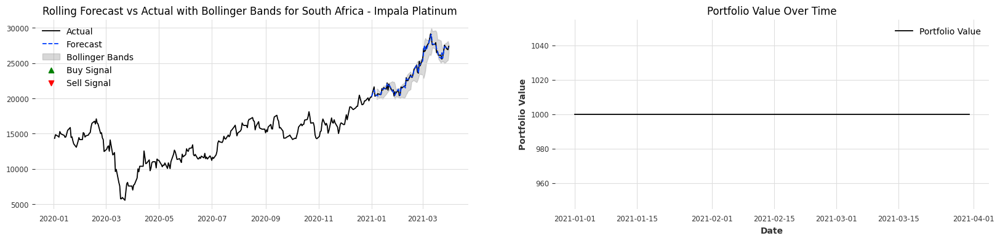

 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2896.984, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2898.195, Time=0.05 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2896.349, Time=0.08 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=2898.283, Time=0.11 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=2898.504, Time=0.13 sec
 ARIMA(0,1,5)(0,0,0)[0] intercept   : AIC=2899.831, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2897.975, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2898.006, Time=0.13 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2898.125, Time=0.13 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=2900.244, Time=0.18 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=2900.258, Time=0.18 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=2895.948, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2897.877, Time=0.07 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=2899.746, Time=0.20 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(3,1,0)(0

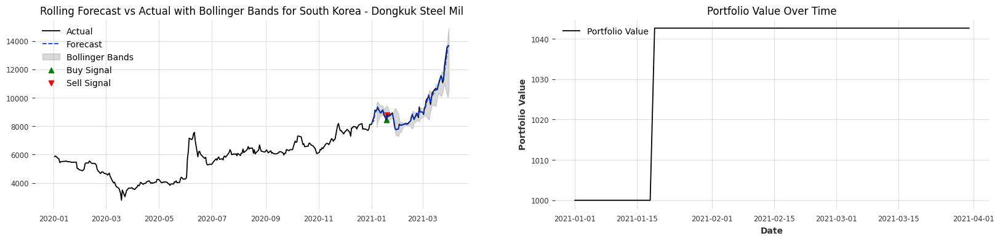

Total final balance: 8193.341075205244
Average final balance: 1024.1676344006555
ROI for the test_duration: 0.024167634400655613
Annualized ROI: 0.10289189812523625


In [ ]:
initial_balance= 1000 # initial balance for each company
test_start='2021-01-01'
test_end = '2021-03-31'
val_start = '2020-09-01'
exchange_rates_df= pd.read_csv('/content/gdrive/My Drive/usd_to_cur_2020.csv', index_col='Date', parse_dates=True)
results, final_balance_all, buy_sell_all, portfolio_all = prediction_strategy_arimax_model(sheet_dict, target_col='Price',
            past_covariates_df=exchange_rates_df, val_start='2020-11-01', test_start='2021-01-01', test_end='2021-03-31', lags=3, initial_balance = initial_balance)
total_final_balance = sum(final_balance_all.values())
print(f"Total final balance: {total_final_balance}")
total_initial_balance = initial_balance*len(sheet_dict)
print(f"Average final balance: {total_final_balance / len(sheet_dict)}")
print(f"ROI for the test_duration: {total_final_balance/ total_initial_balance - 1}")
fraction = fraction_of_year(test_start, test_end)
print(f"Annualized ROI: {((total_final_balance / total_initial_balance) **(1/fraction)) - 1}")


In [ ]:
total_final_balance = sum(final_balance_all.values())
print(f"Total final balance: {total_final_balance}")
total_initial_balance = initial_balance*len(sheet_dict)
print(f"Average final balance: {total_final_balance / len(sheet_dict)}")
print(f"ROI for the test_duration: {total_final_balance/ total_initial_balance - 1}")
fraction = fraction_of_year(test_start, test_end)
print(f"Annualized ROI: {((total_final_balance / total_initial_balance) **(1/fraction)) - 1}")


Total final balance: 8193.341075205244
Average final balance: 1024.1676344006555
ROI for the test_duration: 0.024167634400655613
Annualized ROI: 0.10289189812523625


By using the implemented forecasting models and the trading strategy, we achieved an annualized ROI of up to 22% when utilizing next-day forecasts obtained from the Block LSTM models.